In [307]:
#Для поддержания стабильности работы настоятельно рекомендую работать в среде Jupyter Notebook с использованием версий 
# библиотек из Requirements.txt
#!pip freeze > Requirements.txt

In [2]:
#pip install -r requirements.txt # УСТАНОВКА ИСПОЛЬЗУЕМЫХ ПРИ РАЗРАБОТКЕ БИБЛИОТЕК + ВЕРСИЯ

In [3]:
#!pip install pickle-mixin
#!pip install scikit-learn

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import sklearn

from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor

from tensorflow import keras as keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation
from pandas import read_excel, DataFrame, Series
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from tensorflow.keras.models import Sequential
from numpy.random import seed
from scipy import stats
import warnings
warnings.filterwarnings("ignore")

In [112]:
# читаем полученный датасет x_bp
df_xbp = pd.read_excel('X_bp.xlsx')
print('Раскрываем датафрейм X_bp и проверяем: Описание столбцов, типы данных, количество пропусков: ')
df_xbp.drop(['Unnamed: 0'], axis=1, inplace=True)
df_xbp.head()

Раскрываем датафрейм X_bp и проверяем: Описание столбцов, типы данных, количество пропусков: 


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [113]:
# читаем полученный датасет x_nup
df_xnup = pd.read_excel('X_nup.xlsx')
df_xnup.drop(['Unnamed: 0'], axis=1, inplace=True)
print('Раскрываем датафрейм X_nup и проверяем: Описание столбцов, типы данных, количество пропусков: ')
df_xnup.info()

Раскрываем датафрейм X_nup и проверяем: Описание столбцов, типы данных, количество пропусков: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 24.5 KB


In [114]:
#производим объединение датасетов. по условиям задания объединение идет методом INNER
df = pd.merge(df_xbp, df_xnup, left_index = True, right_index = True, how = 'inner' )
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


In [115]:
# кодируем параметр угол нашивки, градусы на 0 и 1. проверяем результат и датасет в целом
df = df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})
df['Угол нашивки, град'] = df['Угол нашивки, град'].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int32  
 11  Шаг нашивки           

In [116]:
# изучаем уникальные значения в датасете
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [117]:
# изучаем описание датасета по "поверхностным" характеристикам
df_describe = df.describe().T
df_describe

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [118]:
# согласно условиям задания необходимо получить среднее и медианные значения в каждой характеристике датасета. 
mean_and_mediana = df.describe()
mean_and_mediana = mean_and_mediana.loc[['mean', '50%']]
mean_and_mediana.T

,mean,50%
Соотношение матрица-наполнитель,2.930366,2.906878
"Плотность, кг/м3",1975.734888,1977.621657
"модуль упругости, ГПа",739.923233,739.664328
"Количество отвердителя, м.%",110.570769,110.564840
"Содержание эпоксидных групп,%_2",22.244390,22.230744
"Температура вспышки, С_2",285.882151,285.896812
"Поверхностная плотность, г/м2",482.731833,451.864365
"Модуль упругости при растяжении, ГПа",73.328571,73.268805
"Прочность при растяжении, МПа",2466.922843,2459.524526
"Потребление смолы, г/м2",218.423144,219.198882


In [119]:
# проверяем наличие пропусков
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [120]:
# проверяем корреляцию 
df.corr(method = 'kendall')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.003135,0.021247,0.001410,0.010180,-0.009480,-0.002060,-0.004157,0.011614,0.035145,-0.021395,0.022723,0.002788
"Плотность, кг/м3",-0.003135,1.000000,-0.008059,-0.021963,-0.007758,-0.019947,0.037302,-0.021151,-0.047426,-0.017079,-0.051525,-0.031220,0.052935
"модуль упругости, ГПа",0.021247,-0.008059,1.000000,0.022382,0.002351,0.021028,-0.000442,0.005458,0.022959,0.005169,-0.031695,-0.008305,0.049347
"Количество отвердителя, м.%",0.001410,-0.021963,0.022382,1.000000,0.000010,0.059034,0.033110,-0.043140,-0.046507,-0.003677,0.024690,0.006232,0.016607
"Содержание эпоксидных групп,%_2",0.010180,-0.007758,0.002351,0.000010,1.000000,-0.002170,-0.006859,0.041994,-0.013441,0.009756,0.004668,-0.004539,-0.021968
"Температура вспышки, С_2",-0.009480,-0.019947,0.021028,0.059034,-0.002170,1.000000,0.017196,0.016481,-0.019106,0.035313,0.017880,0.029552,0.005268
"Поверхностная плотность, г/м2",-0.002060,0.037302,-0.000442,0.033110,-0.006859,0.017196,1.000000,0.024051,-0.005099,-0.004446,0.045452,0.025514,-0.022320
"Модуль упругости при растяжении, ГПа",-0.004157,-0.021151,0.005458,-0.043140,0.041994,0.016481,0.024051,1.000000,-0.006599,0.034814,0.022431,-0.010024,-0.002600
"Прочность при растяжении, МПа",0.011614,-0.047426,0.022959,-0.046507,-0.013441,-0.019106,-0.005099,-0.006599,1.000000,0.013580,0.020609,-0.048049,0.009821
"Потребление смолы, г/м2",0.035145,-0.017079,0.005169,-0.003677,0.009756,0.035313,-0.004446,0.034814,0.013580,1.000000,-0.002402,0.005962,0.010792


In [121]:
# проверяем корреляцию 
df.corr(method = 'pearson')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


In [122]:
# проверяем корреляцию 
df.corr(method = 'spearman')

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,-0.005542,0.031823,0.002496,0.016358,-0.013635,-0.003896,-0.006459,0.017554,0.054084,-0.026190,0.032510,0.004570
"Плотность, кг/м3",-0.005542,1.000000,-0.010097,-0.032907,-0.012287,-0.030447,0.055071,-0.032446,-0.069816,-0.025729,-0.063073,-0.045941,0.080001
"модуль упругости, ГПа",0.031823,-0.010097,1.000000,0.033397,0.002016,0.031247,-0.001318,0.007705,0.033750,0.008010,-0.038800,-0.011851,0.072628
"Количество отвердителя, м.%",0.002496,-0.032907,0.033397,1.000000,-0.001652,0.086970,0.050751,-0.064127,-0.067707,-0.006371,0.030222,0.008440,0.025265
"Содержание эпоксидных групп,%_2",0.016358,-0.012287,0.002016,-0.001652,1.000000,-0.003641,-0.011232,0.061930,-0.019193,0.014230,0.005714,-0.007421,-0.032182
"Температура вспышки, С_2",-0.013635,-0.030447,0.031247,0.086970,-0.003641,1.000000,0.025441,0.024625,-0.028283,0.051763,0.021886,0.043075,0.008160
"Поверхностная плотность, г/м2",-0.003896,0.055071,-0.001318,0.050751,-0.011232,0.025441,1.000000,0.035319,-0.008221,-0.005344,0.055637,0.037675,-0.032404
"Модуль упругости при растяжении, ГПа",-0.006459,-0.032446,0.007705,-0.064127,0.061930,0.024625,0.035319,1.000000,-0.009970,0.052450,0.027458,-0.014210,-0.003225
"Прочность при растяжении, МПа",0.017554,-0.069816,0.033750,-0.067707,-0.019193,-0.028283,-0.008221,-0.009970,1.000000,0.020831,0.025226,-0.071915,0.014950
"Потребление смолы, г/м2",0.054084,-0.025729,0.008010,-0.006371,0.014230,0.051763,-0.005344,0.052450,0.020831,1.000000,-0.002940,0.009288,0.016236


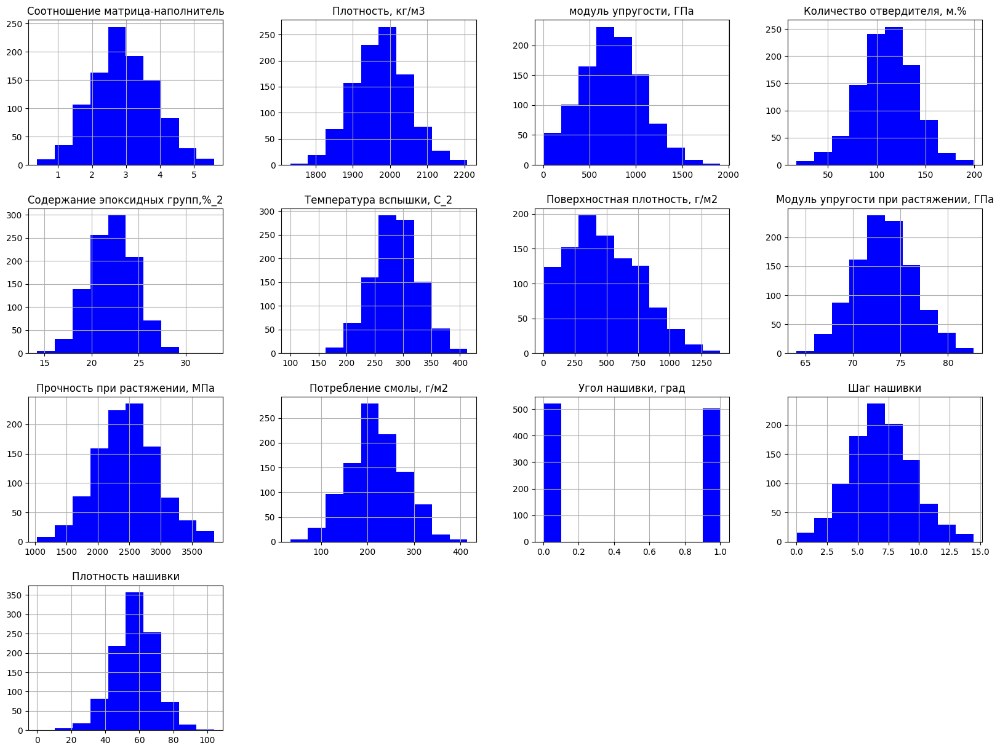

In [123]:
# очевидная корреляция не обнаружена. продолжаем копать. построим гистограмммы для оценки распределения по характеристикам
df.hist(figsize = (20,15), color = "b")
plt.show()

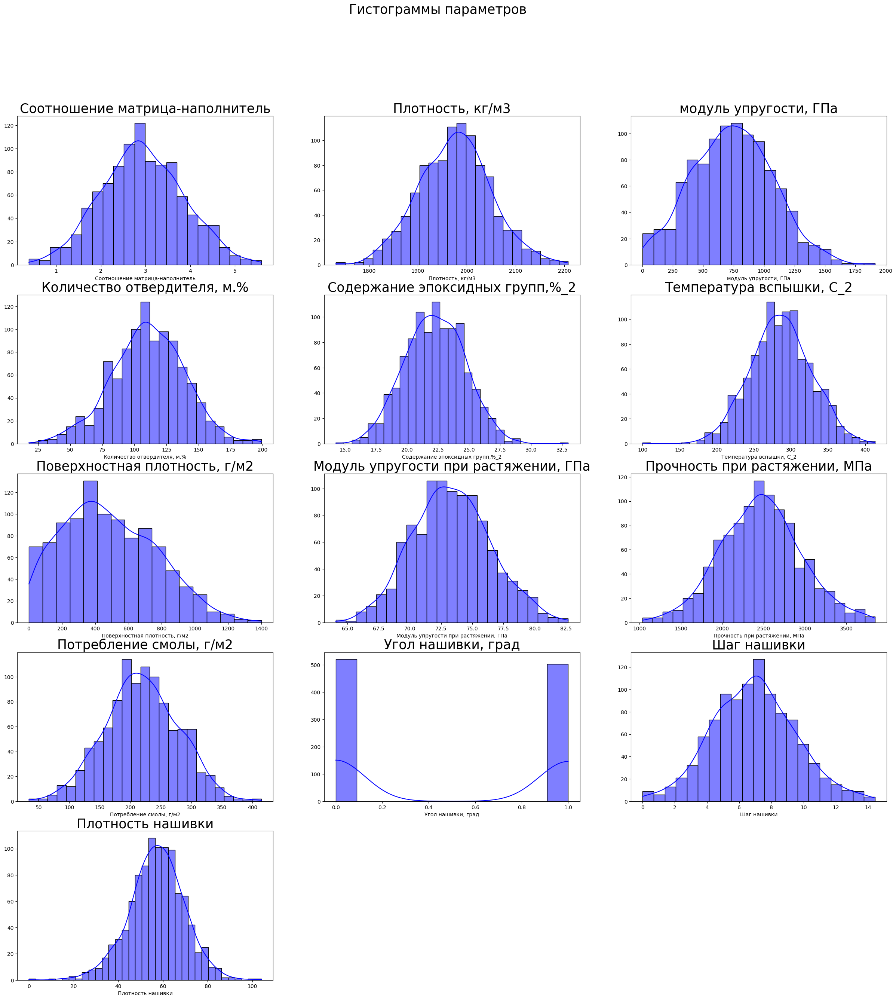

In [124]:
# от параметра к параметру наблюдается не нормальное распределение данных. В некоторых параметрах наблюдается близкое к 
#нормальному. Перестроим гистограммы для более визуально понятного распределения
rows_hist = 5 # количество строк
columns_hist = 3 # количество столцбцов
count_plt = 1 # инициализация plot counter
plt.figure(figsize = (30,30))
plt.suptitle('Гистограммы параметров', fontsize = 25)
for column in df.columns:
    plt.subplot(rows_hist, columns_hist, count_plt)
    sns.histplot(data = df[column], kde=True, color = "blue")
    plt.ylabel(None)
    plt.title(column, size = 25)
    #plt.show()
    count_plt += 1

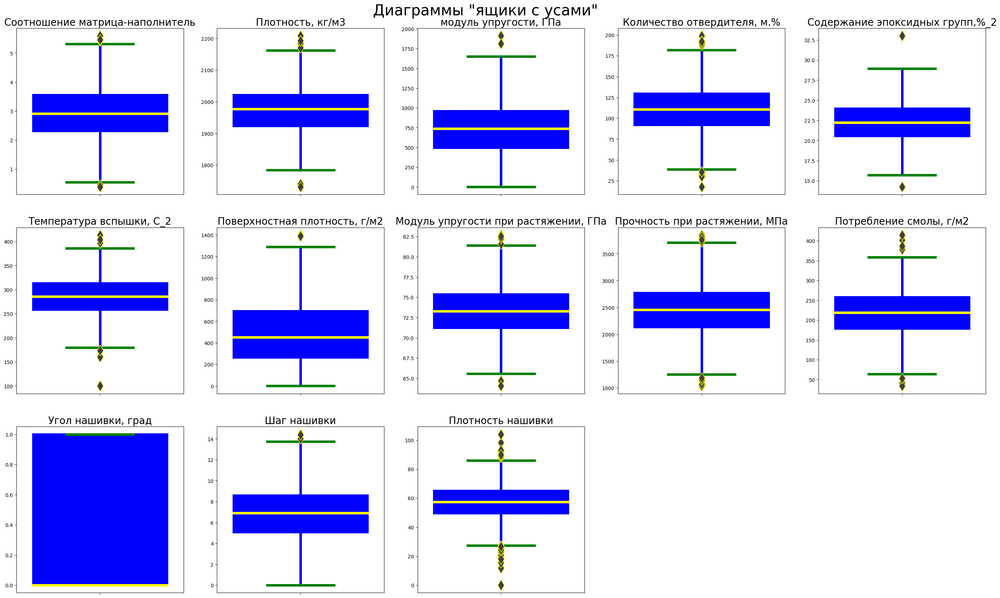

In [15]:
# гистограмма показала присутствие выбросов и и подтвердило гипотезу присутствия ненормального распределения. построим боксплоты
rows_box = 5
columns_box = 5
pltcount = 1
plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9, fontsize = 30)
for column in df.columns:
    plt.subplot(rows_box, columns_box, pltcount)
    sns.boxplot(data = df, y = df[column], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'b'), 
    medianprops = dict(color = 'yellow'), whiskerprops = dict(color="b"), capprops = dict(color = "green"), 
    flierprops = dict(color="y", markeredgecolor = "yellow"))
    plt.ylabel(None)
    plt.title(column, size = 20)
    #plt.show()
    pltcount += 1

<function matplotlib.pyplot.show(close=None, block=None)>

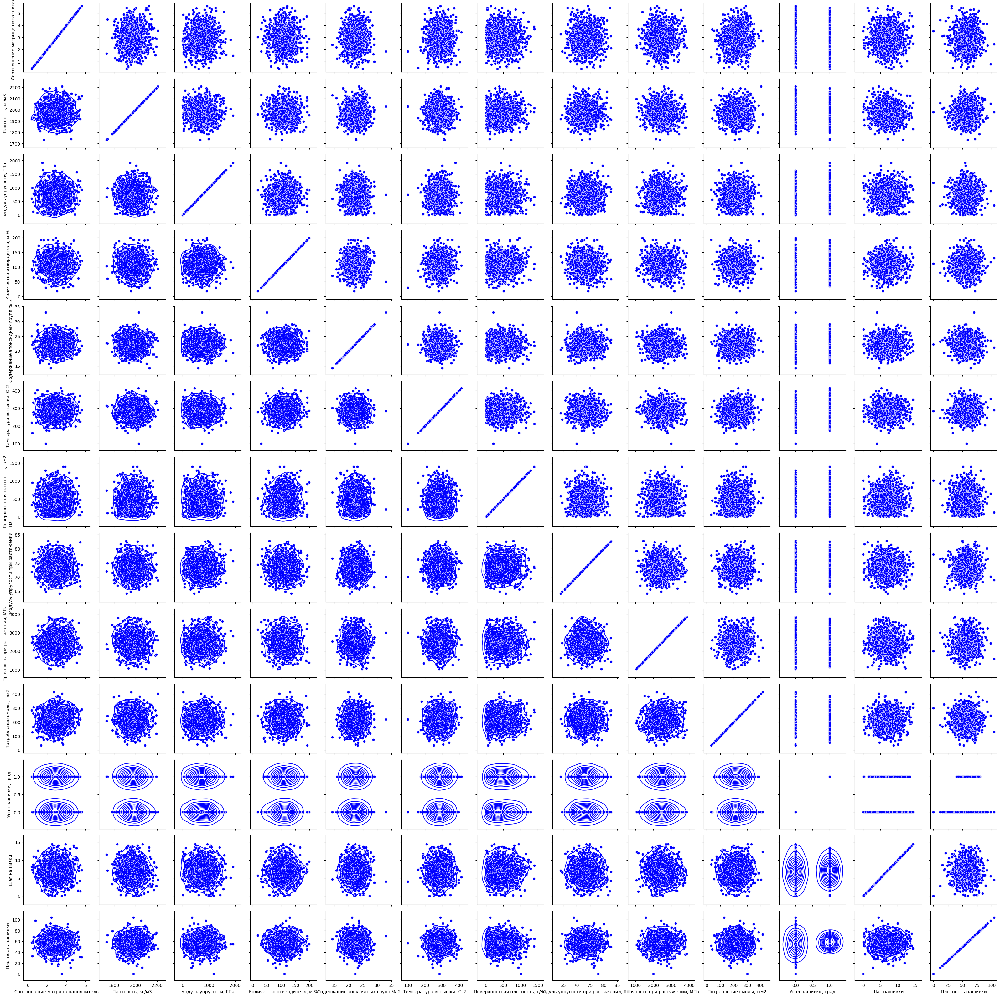

In [16]:
# построенные боксплоты подтвердили присутсвие выбросов практически в каждом параметре. до перехода к работе с выбросами построим
# график попарного рассеивания точек, чтобы подтвердить/исключить наличие зависимостей
g = sns.PairGrid(df[df.columns])
g.map(sns.scatterplot, color = 'blue')
g.map_upper(sns.scatterplot, color = 'blue')
g.map_lower(sns.kdeplot, color = 'blue')
plt.show

In [125]:
# подсчитываем количество выбросов в датасете
m = df.copy()
for i in df.columns:
    m[i] = abs((df[i] - df[i].mean()) / df[i].std())
    print(f"{sum(m[i] > 3)} выбросов в признаке {i}")
print(f' Всего {sum(sum(m.values > 3))} выброса')

0 выбросов в признаке Соотношение матрица-наполнитель
3 выбросов в признаке Плотность, кг/м3
2 выбросов в признаке модуль упругости, ГПа
2 выбросов в признаке Количество отвердителя, м.%
2 выбросов в признаке Содержание эпоксидных групп,%_2
3 выбросов в признаке Температура вспышки, С_2
2 выбросов в признаке Поверхностная плотность, г/м2
0 выбросов в признаке Модуль упругости при растяжении, ГПа
0 выбросов в признаке Прочность при растяжении, МПа
3 выбросов в признаке Потребление смолы, г/м2
0 выбросов в признаке Угол нашивки, град
0 выбросов в признаке Шаг нашивки
7 выбросов в признаке Плотность нашивки
 Всего 24 выброса


In [126]:
# создадим вспомогательный датасет для очистки от выбросов.
column_list_drop = ["Соотношение матрица-наполнитель",
                 "Плотность, кг/м3",
                 "модуль упругости, ГПа",
                 "Количество отвердителя, м.%",
                 "Содержание эпоксидных групп,%_2",
                 "Температура вспышки, С_2",
                 "Поверхностная плотность, г/м2",
                 "Модуль упругости при растяжении, ГПа",
                 "Прочность при растяжении, МПа",
                 "Потребление смолы, г/м2",
                 "Шаг нашивки",
                 "Плотность нашивки"]
# Исключим выбросы, очистим данные от выбросов методом межквартильного расстояния
# Метод межквартильного расстояния позволяет удалить обнаруженные выброса
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i], [75,25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan
df.isnull().sum() 

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [127]:
# обнаружено 64 выброса. 
# удаляем обнаруженные выброса
df = df.dropna(axis=0)
df.isnull().sum()
# проверяем результат удаления.

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [128]:
df.info()
# убеждаемся в изменении датасета. количетсво строк изменилось на 936.

<class 'pandas.core.frame.DataFrame'>
Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    int32  
 11  Шаг нашивки            

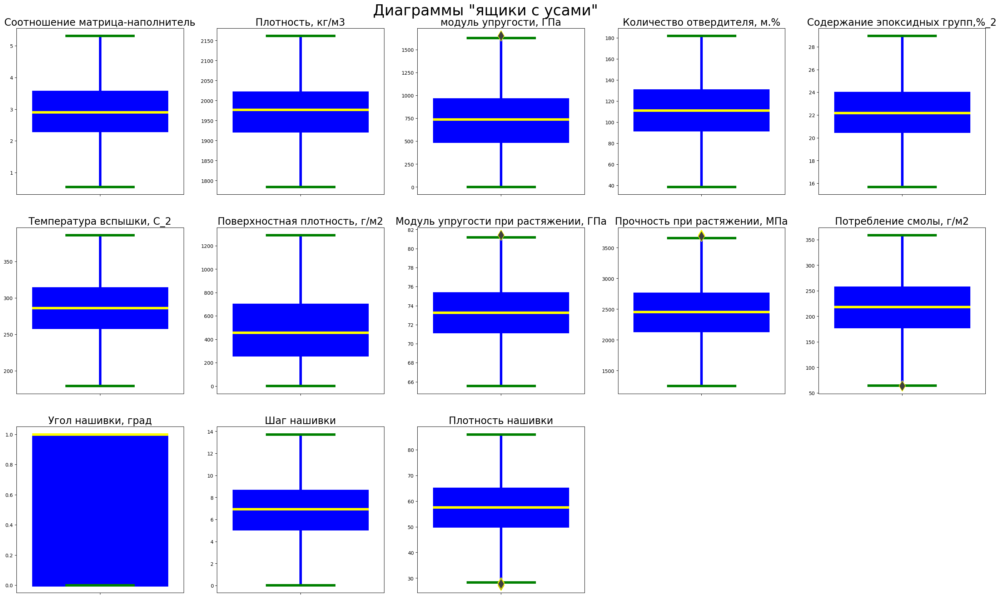

In [129]:
# Постриом боксплот без выбросов
rows_box = 5
columns_box = 5
pltcount = 1
plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9, fontsize = 30)
for column in df.columns:
    plt.subplot(rows_box, columns_box, pltcount)
    sns.boxplot(data = df, y = df[column], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'b'), medianprops = dict(color = 'yellow'), whiskerprops = dict(color="b"), capprops = dict(color = "green"), flierprops = dict(color="y", markeredgecolor = "yellow"))
    plt.ylabel(None)
    plt.title(column, size = 20)
    #plt.show()
    pltcount += 1

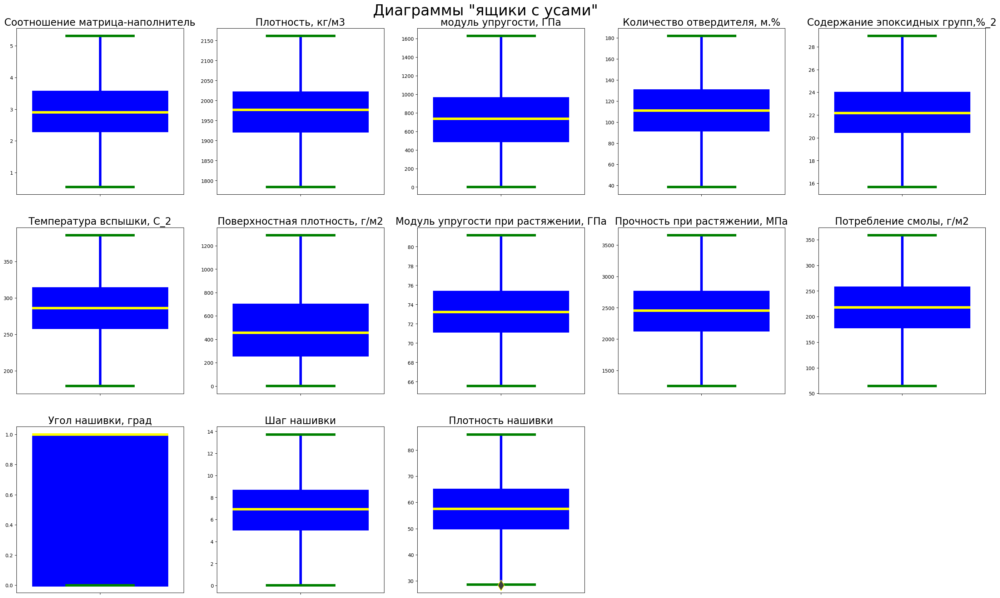

In [130]:
#на графике видно наличие выбросов после проведенной очистки. Повторяем процедуру 
# очистки от выбросов и строим боксплот повторно.
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75, 25])
    intr_qr = q75 - q25
    max = q75 + (1.5 * intr_qr)
    min = q25 - (1.5 * intr_qr)
    df.loc[df[i] < min, i] = np.nan
    df.loc[df[i] > max, i] = np.nan
rows_box = 5
columns_box = 5
pltcount = 1
plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9, fontsize = 30)
for column in df.columns:
    plt.subplot(rows_box, columns_box, pltcount)
    sns.boxplot(data = df, y = df[column], fliersize = 15, linewidth = 5, 
                boxprops = dict(facecolor = 'y', color = 'b'), 
                medianprops = dict(color = 'yellow'), 
                whiskerprops = dict(color="b"), 
                capprops = dict(color = "green"), flierprops = dict(color="y", 
                markeredgecolor = "yellow"))
    plt.ylabel(None)
    plt.title(column, size = 20)
    #plt.show()
    pltcount += 1

In [131]:
#Проверим сумму выбросов по каждому из столбцов
df.isnull().sum()
df = df.dropna(axis=0) # удаляем выбросы

In [132]:
# Удостоверяемся в изменении количества строк в меньшую стороне.
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 926 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       926 non-null    float64
 1   Плотность, кг/м3                      926 non-null    float64
 2   модуль упругости, ГПа                 926 non-null    float64
 3   Количество отвердителя, м.%           926 non-null    float64
 4   Содержание эпоксидных групп,%_2       926 non-null    float64
 5   Температура вспышки, С_2              926 non-null    float64
 6   Поверхностная плотность, г/м2         926 non-null    float64
 7   Модуль упругости при растяжении, ГПа  926 non-null    float64
 8   Прочность при растяжении, МПа         926 non-null    float64
 9   Потребление смолы, г/м2               926 non-null    float64
 10  Угол нашивки, град                    926 non-null    int32  
 11  Шаг нашивки            

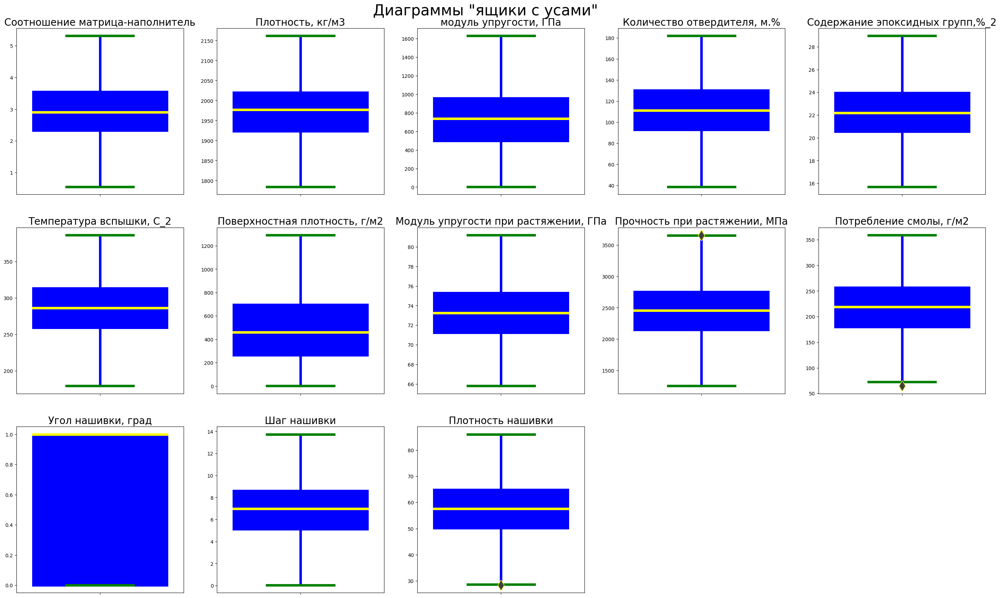

In [133]:
# Количество строк 926. строим боксплот.
rows_box = 5
columns_box = 5
pltcount = 1
plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9, fontsize = 30)
for column in df.columns:
    plt.subplot(rows_box, columns_box, pltcount)
    sns.boxplot(data = df, y = df[column], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'b'), medianprops = dict(color = 'yellow'), whiskerprops = dict(color="b"), capprops = dict(color = "green"), flierprops = dict(color="y", markeredgecolor = "yellow"))
    plt.ylabel(None)
    plt.title(column, size = 20)
    #plt.show()
    pltcount += 1

In [134]:
# Повторяем процедуру в связи с обнаруженными выбросами после чистки
for i in column_list_drop:
    q75, q25 = np.percentile(df.loc[:,i],[75, 25])
    intr_qr = q75 - q25
    max = q75 + (1.5*intr_qr)
    min = q25 - (1.5*intr_qr)
    df.loc[df[i] < min,i] = np.nan
    df.loc[df[i] > max,i] = np.nan
# подсчитываем выбросы, удаляем выбросы
df.isnull().sum()
df = df.dropna(axis=0)

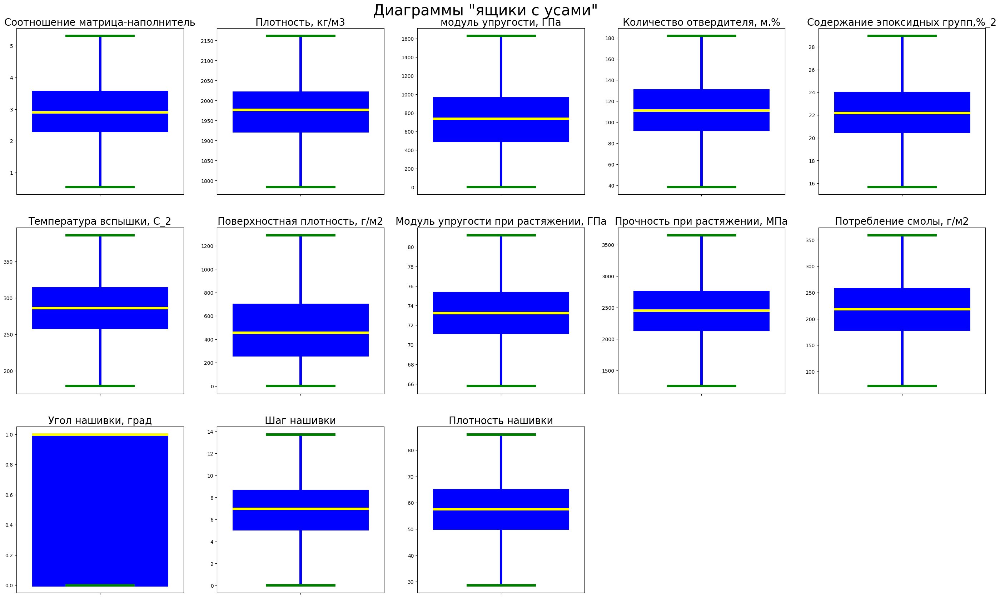

In [135]:
# строим боксплоты
rows_box = 5
columns_box = 5
pltcount = 1
plt.figure(figsize = (35,35))
plt.suptitle('Диаграммы "ящики с усами"', y = 0.9, fontsize = 30)
for column in df.columns:
    plt.subplot(rows_box, columns_box, pltcount)
    sns.boxplot(data = df, y = df[column], fliersize = 15, linewidth = 5, boxprops = dict(facecolor = 'y', color = 'b'), medianprops = dict(color = 'yellow'), whiskerprops = dict(color="b"), capprops = dict(color = "green"), flierprops = dict(color="y", markeredgecolor = "yellow"))
    plt.ylabel(None)
    plt.title(column, size = 20)
    #plt.show()
    pltcount += 1

<function matplotlib.pyplot.show(close=None, block=None)>

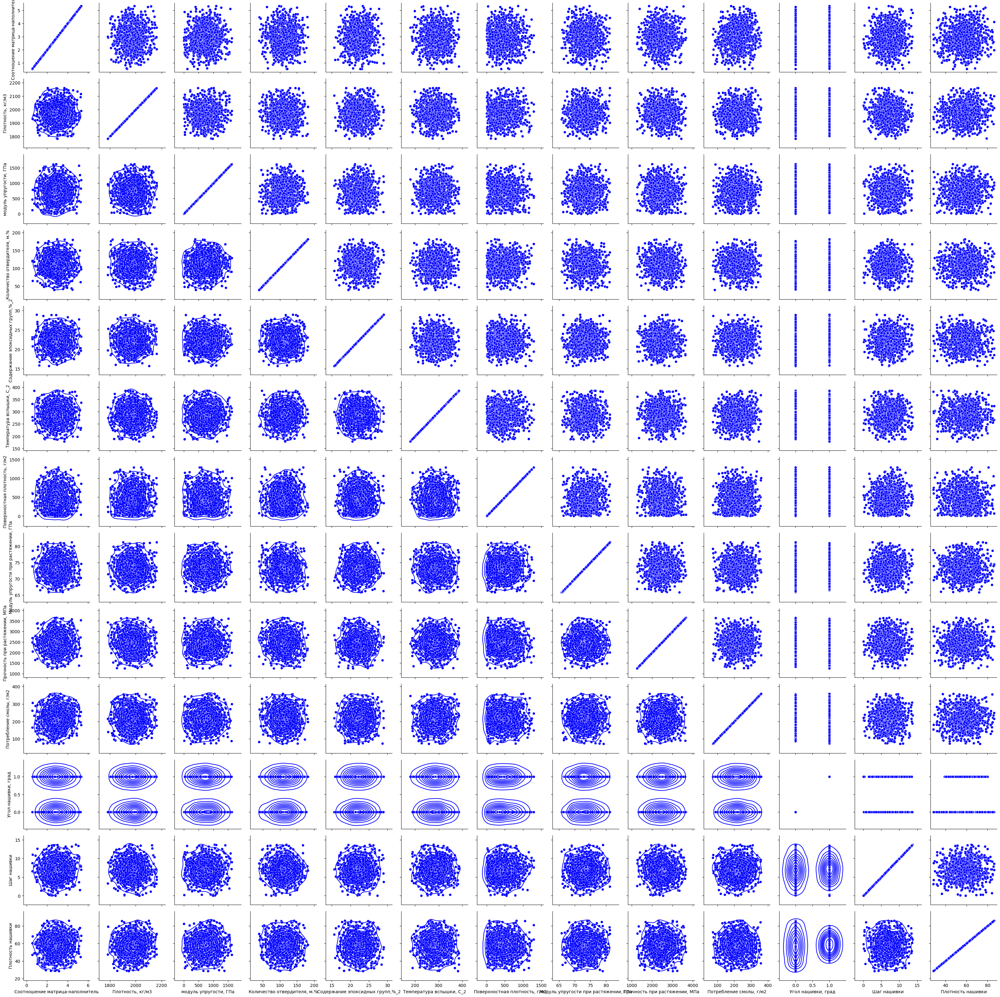

In [28]:
# строим диаграмму попарного рассеивания без выбросов.
g = sns.PairGrid(df[df.columns])
g.map(sns.scatterplot, color = 'blue')
g.map_upper(sns.scatterplot, color = 'blue')
g.map_lower(sns.kdeplot, color = 'blue')
plt.show

In [29]:
#Сохраняем датасет без выбросов.
df.to_csv('final_output.csv', encoding = 'cp1251' )
df.to_excel("final_output.xlsx")

In [136]:
# проведем потовроный разведочный анализ на данных без выборосов
df.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


In [137]:
mean_and_mediana = df.describe()
mean_and_mediana = mean_and_mediana.loc[['mean', '50%']]
mean_and_mediana.T

,mean,50%
Соотношение матрица-наполнитель,2.927964,2.907832
"Плотность, кг/м3",1974.118744,1977.321002
"модуль упругости, ГПа",736.119982,736.178435
"Количество отвердителя, м.%",111.136066,111.162090
"Содержание эпоксидных групп,%_2",22.200570,22.177681
"Температура вспышки, С_2",286.181128,286.220763
"Поверхностная плотность, г/м2",482.429070,457.732246
"Модуль упругости при растяжении, ГПа",73.303464,73.247594
"Прочность при растяжении, МПа",2461.491315,2455.974462
"Потребление смолы, г/м2",218.048059,218.697660


# Нормализация данных

<Axes: ylabel='Density'>

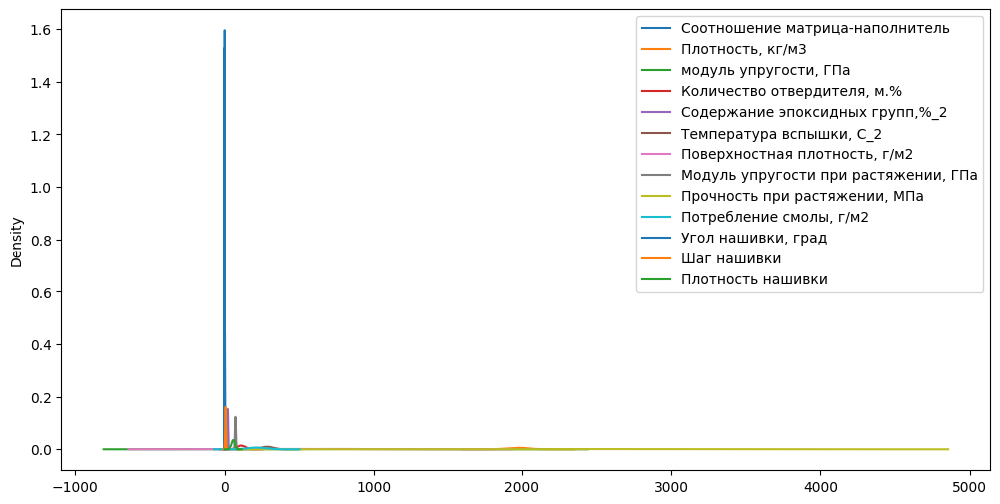

In [138]:
df_norm = df.copy()
fig, ax = plt.subplots(figsize = (12, 6))
df_norm.plot(kind = 'kde', ax = ax)
# Оценка плотности ядра показывает, что данные необходимо нормализировать.

In [139]:
#Нормализуем данные с помощью MinMaxScaler() 
scaler = preprocessing.MinMaxScaler()
col = df.columns
result = scaler.fit_transform(df)

df_minmax_n = pd.DataFrame(result, columns = col)
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


[Text(0, 0, 'Соотношение матрица-наполнитель'),
 Text(1, 0, 'Плотность, кг/м3'),
 Text(2, 0, 'модуль упругости, ГПа'),
 Text(3, 0, 'Количество отвердителя, м.%'),
 Text(4, 0, 'Содержание эпоксидных групп,%_2'),
 Text(5, 0, 'Температура вспышки, С_2'),
 Text(6, 0, 'Поверхностная плотность, г/м2'),
 Text(7, 0, 'Модуль упругости при растяжении, ГПа'),
 Text(8, 0, 'Прочность при растяжении, МПа'),
 Text(9, 0, 'Потребление смолы, г/м2'),
 Text(10, 0, 'Угол нашивки, град'),
 Text(11, 0, 'Шаг нашивки'),
 Text(12, 0, 'Плотность нашивки')]

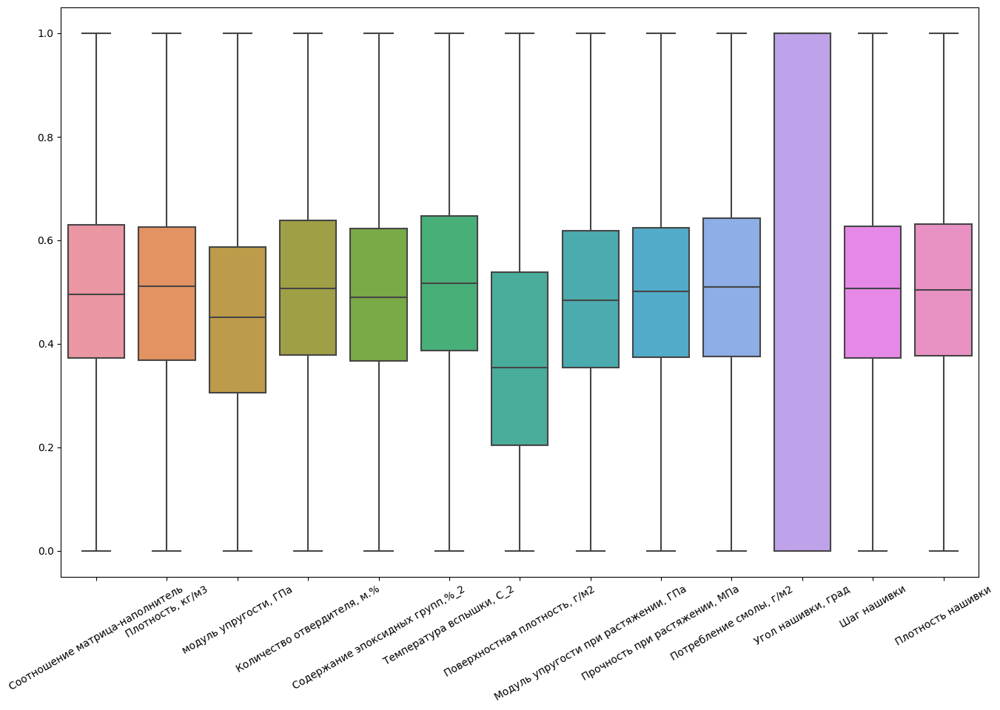

In [140]:
plt.figure(figsize = (16,10))
ax = sns.boxplot(data = df_minmax_n)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

<Axes: ylabel='Density'>

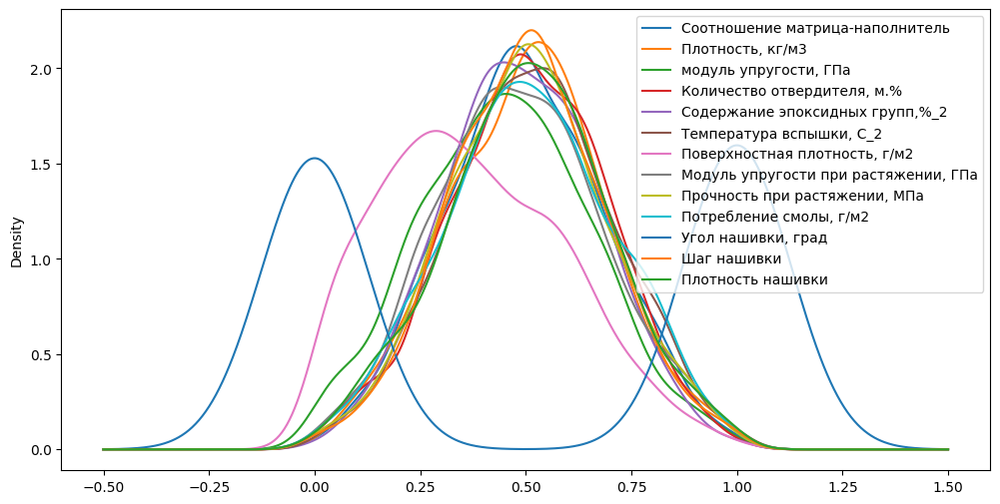

In [141]:
fig, ax = plt.subplots(figsize = (12, 6))
df_minmax_n.plot(kind = 'kde', ax = ax)

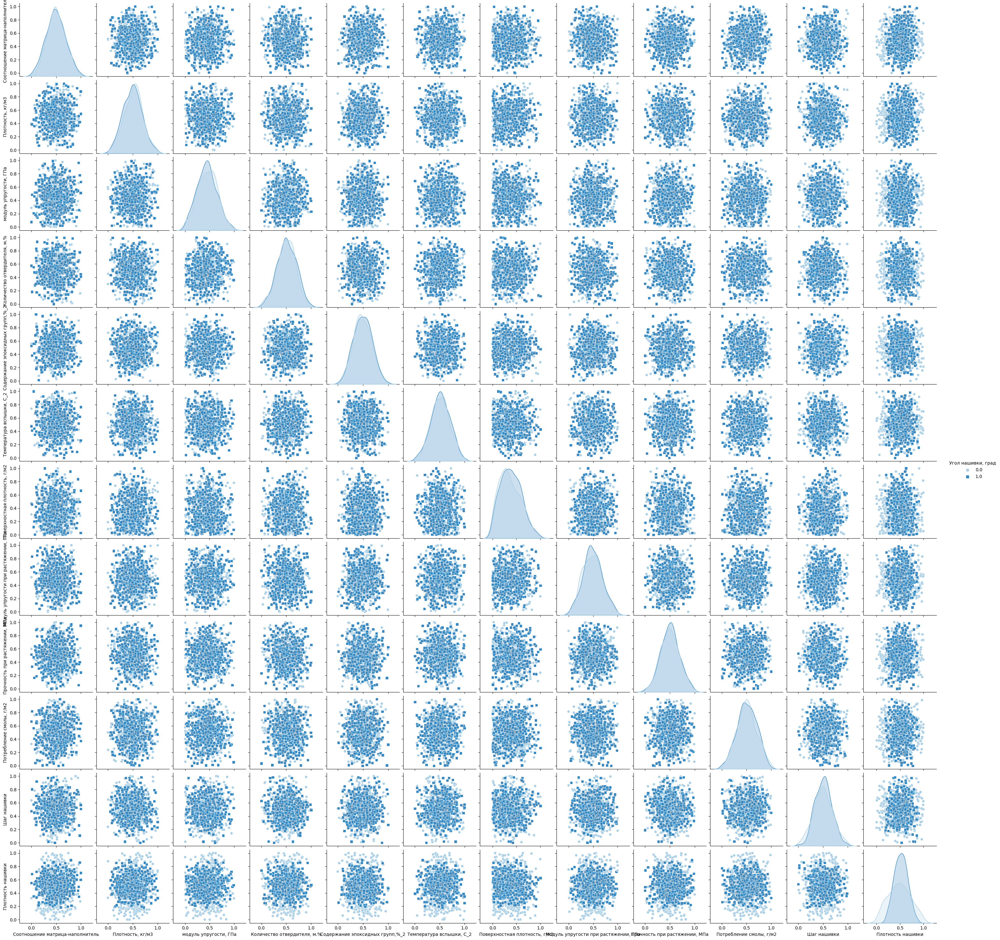

In [36]:
sns.pairplot(df_minmax_n, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette = 'Blues')

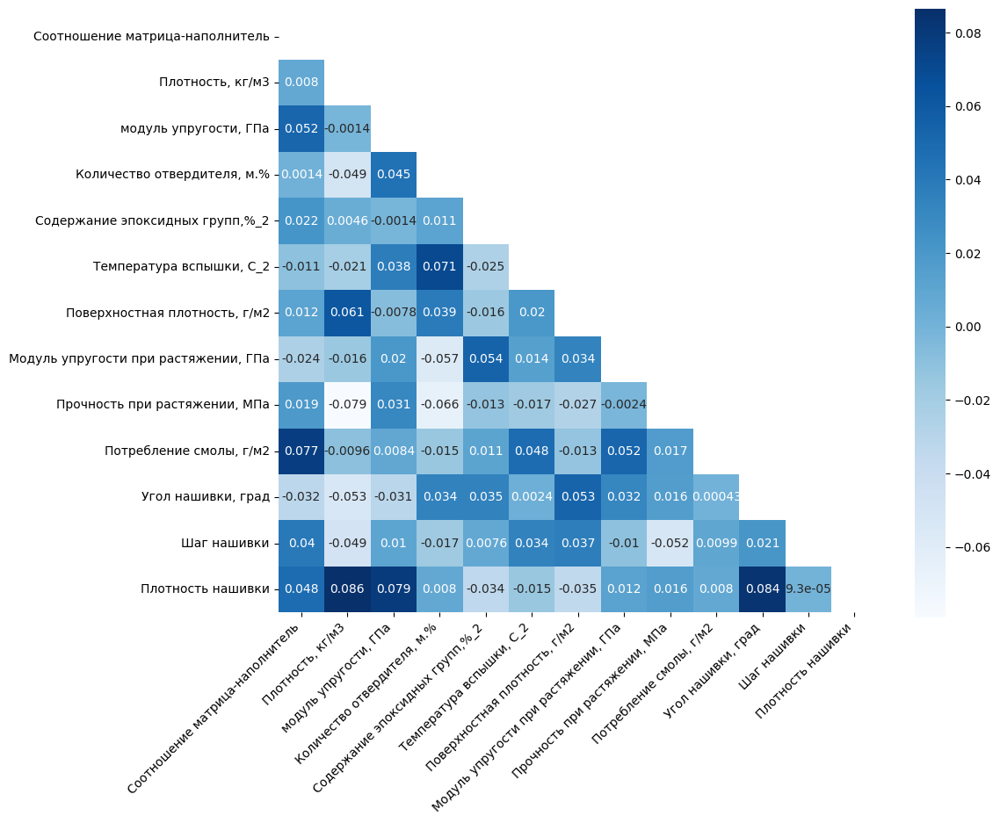

In [142]:
mask = np.triu(df_minmax_n.corr())
f, ax = plt.subplots(figsize = (11, 9))
sns.heatmap(df_minmax_n.corr(), mask = mask, annot = True, square = True, cmap = 'Blues')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

In [143]:
#В рамках поиска и тестирования наилучшего метода проведем нормализацию 
#с помощью Normalizer()

normalizer = Normalizer()
res = normalizer.fit_transform(df)
df_norm_n = pd.DataFrame(res, columns = df.columns)
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494
918,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827
919,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652
920,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736


<Axes: ylabel='Density'>

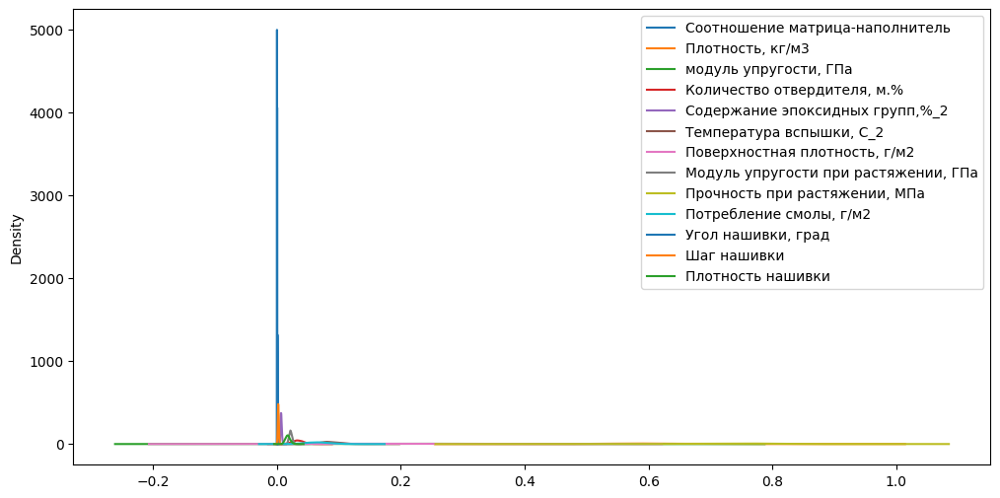

In [144]:
fig, ax = plt.subplots(figsize = (12, 6))
df_norm_n.plot(kind = 'kde', ax = ax)

In [145]:
#Сравним с данными до нормализации
df.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0
7,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0,7.0,47.0
8,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0,7.0,57.0
9,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,60.0
10,2.919678,2160.0,933.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,7.0,70.0
11,2.877358,1990.0,1628.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0,9.0,47.0


In [146]:
# Проверяем перевод данных из нормализованных в исходные
col = df_minmax_n.columns
result_reverse = scaler.inverse_transform(df_minmax_n)
initial_data = pd.DataFrame(result_reverse, columns = col)
initial_data.head(10)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
1,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
2,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
3,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
4,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0
5,2.561475,1900.0,535.000000,111.86,22.267857,284.615385,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
6,3.557018,1930.0,889.000000,129.00,21.250000,300.000000,380.0,75.0,1800.0,120.0,0.0,7.0,57.0
7,3.532338,2100.0,1421.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,60.0
8,2.919678,2160.0,933.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,7.0,70.0
9,2.877358,1990.0,1628.000000,129.00,21.250000,300.000000,1010.0,78.0,2000.0,300.0,0.0,9.0,47.0


In [147]:
#Рассмотрим несколько вариантов корреляции между параметрами после нормализации
df_norm_n[df_norm_n.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.281512,0.032460,0.137378,0.221541,0.180002,0.025513,0.262013,-0.257978,0.157659,-0.010611,0.136843,0.175839
"Плотность, кг/м3",0.281512,1.000000,-0.042233,0.390253,0.658281,0.564884,0.067392,0.875269,-0.837849,0.314219,0.082452,0.291974,0.445379
"модуль упругости, ГПа",0.032460,-0.042233,1.000000,0.049364,-0.028060,0.003038,-0.026006,-0.026914,-0.386917,-0.009529,-0.039522,0.002268,0.044303
"Количество отвердителя, м.%",0.137378,0.390253,0.049364,1.000000,0.305395,0.311569,0.067273,0.376425,-0.379828,0.143166,0.064597,0.121374,0.203167
"Содержание эпоксидных групп,%_2",0.221541,0.658281,-0.028060,0.305395,1.000000,0.404877,0.027470,0.660206,-0.551282,0.244822,0.098492,0.236752,0.280886
"Температура вспышки, С_2",0.180002,0.564884,0.003038,0.311569,0.404877,1.000000,0.038395,0.563793,-0.509841,0.246410,0.063124,0.216858,0.260809
"Поверхностная плотность, г/м2",0.025513,0.067392,-0.026006,0.067273,0.027470,0.038395,1.000000,0.055252,-0.318775,0.007772,0.043869,0.065979,-0.017402
"Модуль упругости при растяжении, ГПа",0.262013,0.875269,-0.026914,0.376425,0.660206,0.563793,0.055252,1.000000,-0.741163,0.328966,0.109996,0.302476,0.416465
"Прочность при растяжении, МПа",-0.257978,-0.837849,-0.386917,-0.379828,-0.551282,-0.509841,-0.318775,-0.741163,1.000000,-0.282606,-0.058592,-0.279843,-0.379346
"Потребление смолы, г/м2",0.157659,0.314219,-0.009529,0.143166,0.244822,0.246410,0.007772,0.328966,-0.282606,1.000000,0.033128,0.116685,0.140756


In [148]:
df_minmax_n[df_minmax_n.columns].corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.007996,0.051643,0.001353,0.021982,-0.010565,0.011910,-0.024316,0.019141,0.076857,-0.032144,0.039924,0.047835
"Плотность, кг/м3",0.007996,1.000000,-0.001416,-0.048938,0.004568,-0.021256,0.061496,-0.015597,-0.079188,-0.009609,-0.052993,-0.048648,0.086460
"модуль упругости, ГПа",0.051643,-0.001416,1.000000,0.044550,-0.001442,0.037622,-0.007805,0.020063,0.031041,0.008368,-0.031490,0.010238,0.078810
"Количество отвердителя, м.%",0.001353,-0.048938,0.044550,1.000000,0.011429,0.070623,0.038762,-0.057026,-0.065711,-0.014827,0.034103,-0.017394,0.007981
"Содержание эпоксидных групп,%_2",0.021982,0.004568,-0.001442,0.011429,1.000000,-0.025315,-0.015844,0.053887,-0.013099,0.010808,0.034520,0.007571,-0.034481
"Температура вспышки, С_2",-0.010565,-0.021256,0.037622,0.070623,-0.025315,1.000000,0.020307,0.014168,-0.017263,0.048142,0.002371,0.034395,-0.015014
"Поверхностная плотность, г/м2",0.011910,0.061496,-0.007805,0.038762,-0.015844,0.020307,1.000000,0.033526,-0.027320,-0.012606,0.053180,0.036931,-0.034989
"Модуль упругости при растяжении, ГПа",-0.024316,-0.015597,0.020063,-0.057026,0.053887,0.014168,0.033526,1.000000,-0.002393,0.051676,0.031910,-0.010193,0.012488
"Прочность при растяжении, МПа",0.019141,-0.079188,0.031041,-0.065711,-0.013099,-0.017263,-0.027320,-0.002393,1.000000,0.016753,0.016144,-0.051580,0.016311
"Потребление смолы, г/м2",0.076857,-0.009609,0.008368,-0.014827,0.010808,0.048142,-0.012606,0.051676,0.016753,1.000000,0.000433,0.009932,0.008012


In [149]:
df_minmax_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.274768,0.651097,0.452951,0.079153,0.607435,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.289334,0.546433
1,0.274768,0.651097,0.452951,0.630983,0.418887,0.583596,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.319758
2,0.466552,0.651097,0.461725,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.494123
3,0.465836,0.571539,0.458649,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.546433
4,0.424236,0.332865,0.494944,0.511257,0.495653,0.509164,0.162230,0.272962,0.727777,0.514688,0.0,0.362355,0.720799
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.361662,0.444480,0.560064,0.337550,0.333908,0.703458,0.161609,0.473553,0.472912,0.183151,1.0,0.660014,0.320103
918,0.607674,0.704373,0.272088,0.749605,0.294428,0.362087,0.271207,0.462512,0.461722,0.157752,1.0,0.768759,0.437468
919,0.573391,0.498274,0.254927,0.501991,0.623085,0.334063,0.572959,0.580201,0.587558,0.572648,1.0,0.301102,0.679468
920,0.662497,0.748688,0.454635,0.717585,0.267818,0.466417,0.496511,0.535317,0.341643,0.434855,1.0,0.458245,0.516112


In [150]:
df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121
1,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618
2,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298
3,0.000746,0.539271,0.201687,0.030161,0.006004,0.076742,0.056623,0.018874,0.808906,0.059320,0.000000,0.001348,0.016178
4,0.000699,0.519919,0.219673,0.030449,0.006062,0.077475,0.057164,0.019055,0.816627,0.059886,0.000000,0.001361,0.019055
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494
918,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827
919,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652
920,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736


# Стандартизируем данные

In [151]:
X1 = df_minmax_n.copy()
X2 = df_norm_n.copy()

In [152]:
df_std_X1 = preprocessing.StandardScaler().fit(X1)
df_standart_X1 = df_std_X1.transform(X1)
df_standart_1 = pd.DataFrame(df_standart_X1)

<Axes: ylabel='Density'>

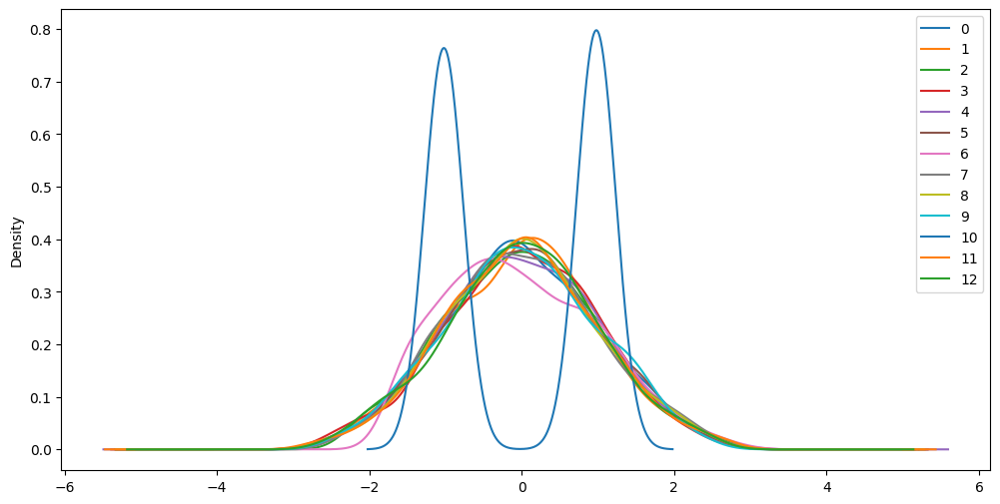

In [153]:
fig, ax = plt.subplots(figsize = (12, 6))
df_standart_1.plot(kind = 'kde', ax = ax)

In [154]:
df_standart_1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.196467,0.787037,0.007992,-2.286425,0.647585,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-1.166792,0.219240
1,-1.196467,0.787037,0.007992,0.668092,-0.397291,0.350738,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.950227
2,-0.175012,0.787037,0.051553,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,-0.050637
3,-0.178825,0.364514,0.036283,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,0.219240
4,-0.400390,-0.903054,0.216474,0.027074,0.028123,-0.039740,-0.971971,-1.092335,1.187925,0.034181,-1.021932,-0.768833,1.118831
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.733662,-0.310284,0.539767,-0.902956,-0.868217,0.979545,-0.974830,-0.070267,-0.163679,-1.629244,0.978538,0.853400,-0.948449
918,0.576611,1.069974,-0.889924,1.303201,-1.087006,-0.811326,-0.470122,-0.126524,-0.223019,-1.756683,0.978538,1.446055,-0.342933
919,0.394018,-0.024589,-0.975122,-0.022536,0.734311,-0.958342,0.919470,0.473140,0.444312,0.324984,0.978538,-1.102660,0.905599
920,0.868603,1.305328,0.016356,1.131763,-1.234469,-0.263996,0.567419,0.244441,-0.859827,-0.366368,0.978538,-0.246233,0.062808


In [155]:
df_std_X2 = preprocessing.StandardScaler().fit(X2)
df_standart_X2 = df_std_X2.transform(X2)
df_standart_2 = pd.DataFrame(df_standart_X2)

<Axes: ylabel='Density'>

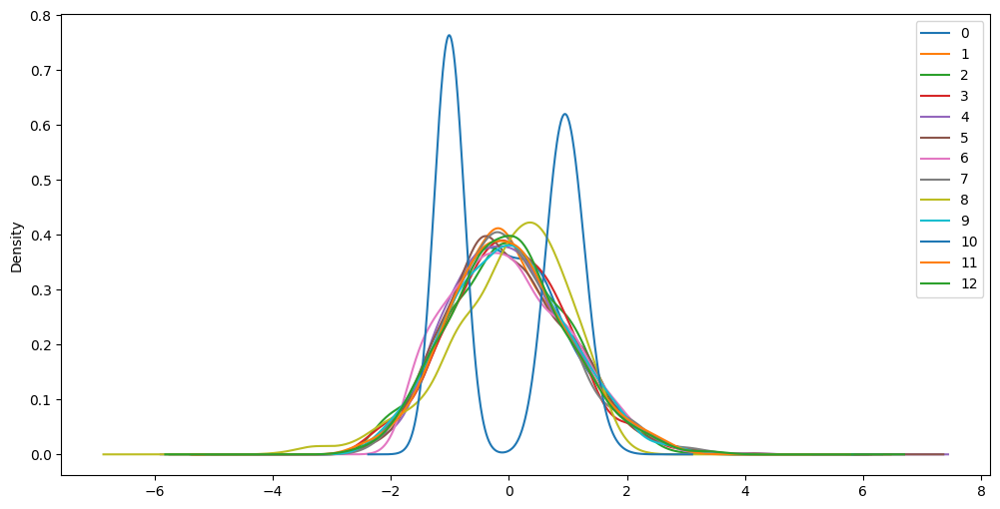

In [156]:
fig, ax = plt.subplots(figsize = (12, 6))
df_standart_2.plot(kind = 'kde', ax=ax)

In [157]:
df_standart_2

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.350498,-0.800587,-0.225645,-2.254951,-0.330124,-0.671638,-1.055275,-1.355362,1.083430,-0.367448,-1.010316,-1.270050,-0.337462
1,-1.351860,-0.807188,-0.227264,0.108938,-0.995822,-0.400917,-1.055800,-1.361270,1.074341,-0.369941,-1.010316,-0.938747,-1.261078
2,-0.493829,-0.810003,-0.187937,-0.405305,-0.728743,-0.677298,-1.056024,-1.363790,1.070465,-0.371004,-1.010316,-0.939301,-0.554499
3,-0.484962,-0.896227,-0.192219,-0.389758,-0.701418,-0.653706,-1.052902,-1.328659,1.124504,-0.356180,-1.010316,-0.931586,-0.322473
4,-0.648927,-1.196396,-0.004208,-0.357656,-0.644997,-0.604992,-1.046455,-1.256122,1.236081,-0.325573,-1.010316,-0.915657,0.436003
...,...,...,...,...,...,...,...,...,...,...,...,...,...
917,-0.646503,0.072936,0.641033,-0.762769,-0.505500,0.900672,-0.959086,0.143638,0.069576,-1.479779,1.005415,0.862968,-0.766453
918,0.676313,0.694067,-0.845152,1.342997,-0.571810,-0.464729,-0.418815,0.263359,0.113365,-1.570525,1.036781,1.493975,-0.151358
919,0.239190,-0.371131,-1.034407,-0.171548,0.241010,-0.956746,0.837232,-0.184553,0.616810,0.153718,0.889772,-1.103709,0.593392
920,1.073279,1.048848,0.192114,1.317553,-0.518818,0.140773,0.732541,0.659236,-0.937103,-0.135918,1.092595,-0.087233,0.352074


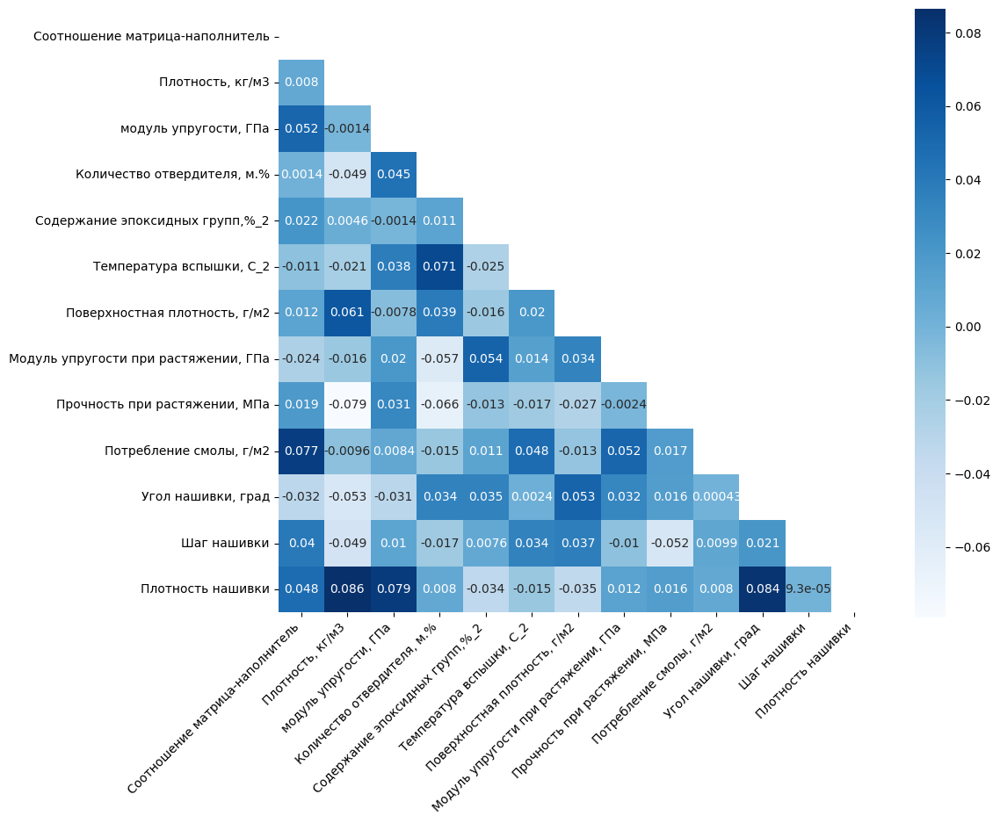

In [158]:
# построим тепловую карту корреляции с minmax
mask = np.triu(X1.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X1.corr(), mask=mask, annot=True, square=True, cmap='Blues')
plt.xticks(rotation=45, ha='right')
plt.show()

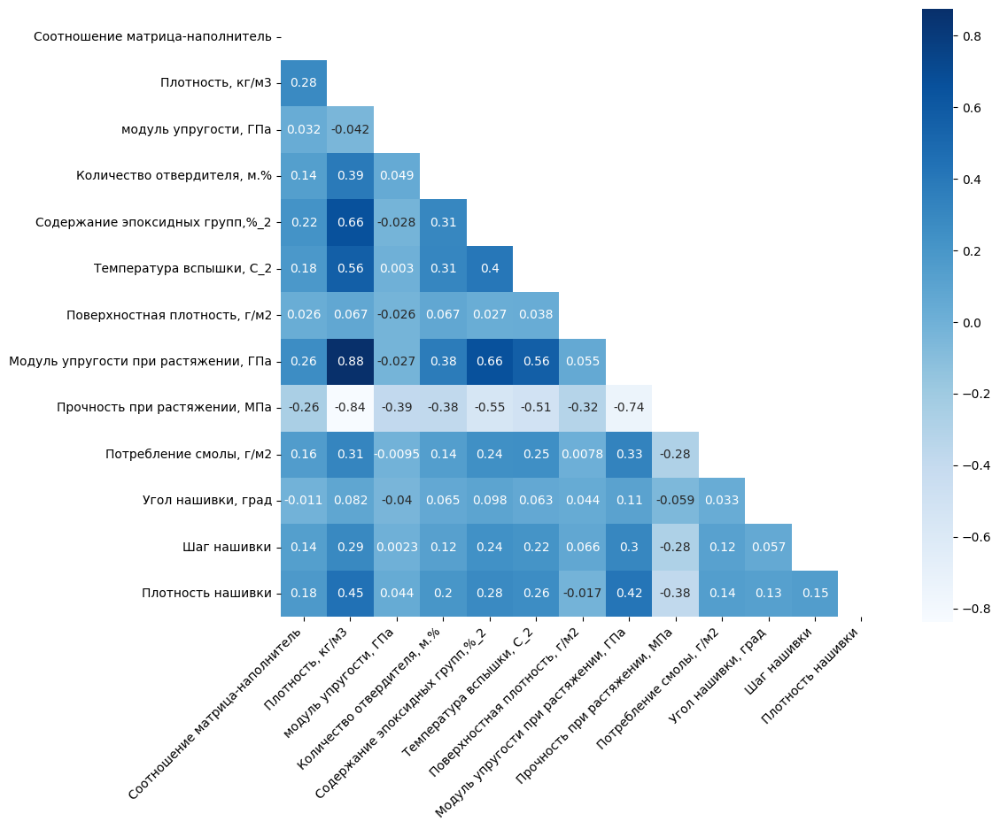

In [159]:
# построим тепловую карту корреляци
mask = np.triu(X2.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X2.corr(), mask=mask, annot=True, square=True, cmap='Blues')
plt.xticks(rotation=45, ha='right')
plt.show()

In [160]:
df_norm_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.000885,0.597049,0.220075,0.033657,0.006717,0.086572,0.144885,0.022174,0.731093,0.065909,0.000155,0.002101,0.017401
std,0.000286,0.064504,0.095713,0.008973,0.001016,0.015045,0.083872,0.002485,0.069235,0.018509,0.000153,0.000808,0.003795
min,0.000163,0.444650,0.000709,0.011339,0.004113,0.049402,0.000230,0.016108,0.463136,0.021630,0.000000,0.000011,0.007195
25%,0.000685,0.552643,0.150901,0.027607,0.005990,0.076193,0.080748,0.020407,0.688177,0.052457,0.000000,0.001543,0.014860
50%,0.000872,0.592130,0.219805,0.033559,0.006654,0.085003,0.140105,0.021973,0.740666,0.065577,0.000244,0.002053,0.017293
75%,0.001068,0.640228,0.289231,0.039565,0.007346,0.096585,0.204309,0.023759,0.780691,0.077899,0.000301,0.002630,0.019756
max,0.001803,0.824241,0.525102,0.062919,0.010887,0.147961,0.414371,0.030620,0.877580,0.122973,0.000419,0.004519,0.030927


In [161]:
df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000
mean,0.499412,0.502904,0.451341,0.506200,0.490578,0.516739,0.373295,0.487343,0.503776,0.507876,0.510846,0.503426,0.503938
std,0.187858,0.188395,0.201534,0.186876,0.180548,0.190721,0.217269,0.196366,0.188668,0.199418,0.500154,0.183587,0.193933
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.371909,0.368184,0.305188,0.378514,0.366571,0.386228,0.204335,0.353512,0.373447,0.374647,0.000000,0.372844,0.376869
50%,0.495189,0.511396,0.451377,0.506382,0.488852,0.516931,0.354161,0.483718,0.501481,0.510143,1.000000,0.506414,0.504310
75%,0.629774,0.624719,0.587193,0.638735,0.623046,0.646553,0.538397,0.617568,0.624299,0.642511,1.000000,0.626112,0.630842
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Описание поставленной задачи приводит к поиску решения в рамках регрессионной модели.
Однако, попарные графики рассеивания точек и тепловая карта не демонстрируют взаимосвязи и возможности прямого прогнозирования, поэтому будем использовать и категориальные подходы к прогнозированию - метод ближайших соседей, обучение со скрытыми слоями, чтобы выявить дополнительные взаимосвязи.

# Разработка модели прогноза прочности при растяжении

В качестве метрики возьмём среднюю абсолютную ошибку (mae) в прогнозах. Для обучения используем 70 % данных, а для тестирования — 30 %.
Разделим данные на тестовую, тренировочную с учетом предсказываемого параметра.

In [162]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
x_train_1, x_test_1, y_train_1, y_test_1 = train_test_split(
    df_norm_n.loc[:, df_norm_n.columns != 'Прочность при растяжении, МПа'],
    df[['Прочность при растяжении, МПа']],
       test_size = 0.3,
    random_state = 42)

In [163]:
# Проверка правильности разбивки
df_norm_n.shape[0] - x_train_1.shape[0] - x_test_1.shape[0]

0

In [164]:
x_train_1.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
481,0.000528,0.589066,0.132149,0.020997,0.006254,0.071450,0.186083,0.020219,0.073037,0.000291,0.002285,0.015563
650,0.000430,0.617300,0.232509,0.027252,0.007346,0.075579,0.081347,0.024837,0.056839,0.000308,0.001350,0.018310
483,0.000580,0.585434,0.170519,0.043402,0.007074,0.096550,0.132807,0.021197,0.041487,0.000295,0.002249,0.018929
355,0.000911,0.545896,0.306130,0.024469,0.006610,0.070488,0.159918,0.018527,0.050148,0.000000,0.001774,0.012540
850,0.000573,0.595720,0.263992,0.034166,0.007519,0.089582,0.095597,0.023521,0.086336,0.000322,0.002765,0.017180


In [165]:
y_train_1

,"Прочность при растяжении, МПа"
552,2641.571967
735,2404.068921
554,2619.854215
403,2793.783901
948,2298.985700
...,...
120,1994.674603
306,2419.732206
959,2758.414767
497,2347.135204


In [166]:
y_test_1

,"Прочность при растяжении, МПа"
360,2167.533030
427,2705.819718
611,2952.839631
336,2305.241225
604,1399.118555
...,...
479,3305.286922
149,2085.866383
561,2461.609016
632,2616.114331


In [167]:
y_train_1.shape

(645, 1)

In [168]:
#Функция для сравнения результатов предсказаний с моделью, выдающей среднее значение по тестовой выборке
def mean_model(y_test_1):
    return [np.mean(y_test_1) for _ in range(len(y_test_1))]
y_1_pred_mean = mean_model(y_test_1)

In [169]:
#Метод опорных векторов
svr = make_pipeline(StandardScaler(), SVR(kernel = 'rbf', C = 500.0, epsilon = 1.0))
#обучаем модель
svr.fit(x_train_1, np.ravel(y_train_1))
#вычисляем коэффициент детерминации
y_pred_svr=svr.predict(x_test_1)
mae_svr = mean_absolute_error(y_pred_svr, y_test_1)
mse_svr_elast = mean_squared_error(y_test_1,y_pred_svr)
print('Support Vector Regression Results Train:') 
print("Test score: {:.2f}".format(svr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test_1, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_svr)))
print('SVR_MSE: {:.2f}'.format(mse_svr_elast))
print("SVR_RMSE: {:.2f}".format (np.sqrt(mse_svr_elast)))
print("Test score: {:.2f}".format(svr.score(x_test_1, y_test_1))) # Скор для тестовой выборки

Support Vector Regression Results Train:
Test score: 0.99
Support Vector Regression Results:
SVR_MAE: 78
SVR_MAPE: 0.04
SVR_MSE: 11671.63
SVR_RMSE: 108.04
Test score: 0.95


MAE for mean target:  368.96801863398946
MSE for mean target:  214046.3755454378
RMSE for mean target:  462.65146227526157


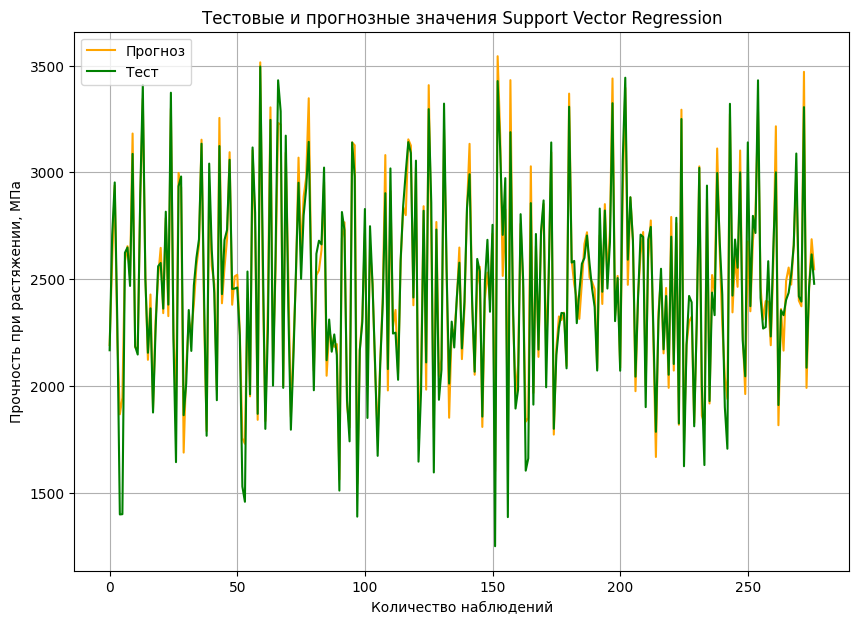

In [170]:
#Результаты модели, выдающей среднее значение
mse_lin_elast_mean = mean_squared_error(y_test_1, y_1_pred_mean)
print("MAE for mean target: ", mean_absolute_error(y_test_1, y_1_pred_mean))
print("MSE for mean target: ", mse_lin_elast_mean)
print("RMSE for mean target: ", np.sqrt(mse_lin_elast_mean))
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Support Vector Regression")
plt.plot(y_pred_svr, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Random Forest Regressor Results Train:
Test score: 0.98
Random Forest Regressor Results:
RF_MAE: 77
RF_MAPE: 0.03
RF_MSE: 9505.97
RF_RMSE: 97.50
Test score: 0.96


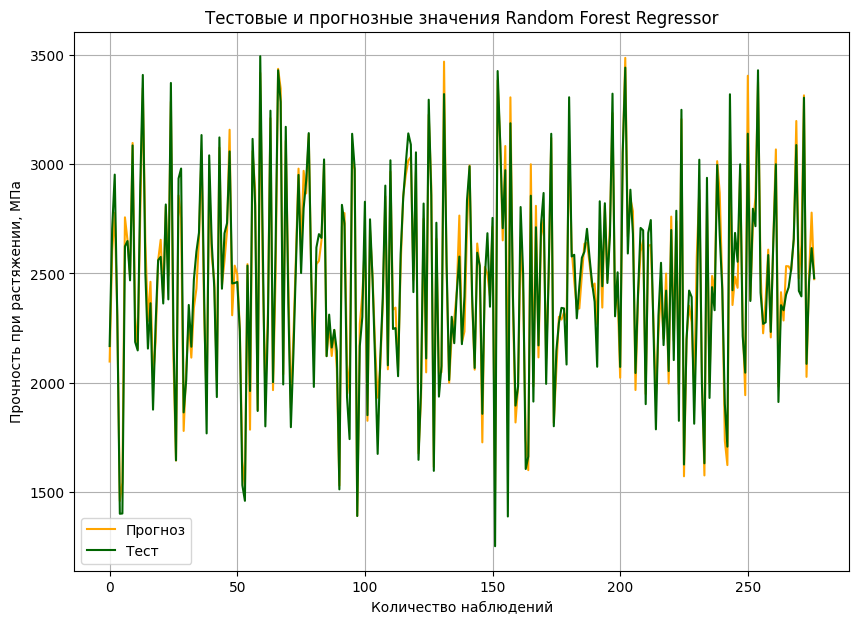

In [171]:
# Метод случайного леса. Построение модели и визуализация
rfr = RandomForestRegressor(n_estimators=15,max_depth=7, random_state=33)
rfr.fit(x_train_1, y_train_1.values)
y_pred_forest = rfr.predict(x_test_1)
mae_rfr = mean_absolute_error(y_pred_forest, y_test_1)
mse_rfr_elast = mean_squared_error(y_test_1,y_pred_forest)
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(rfr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Random Forest Regressor Results:')
print('RF_MAE:', round(mean_absolute_error(y_test_1, y_pred_forest)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_forest)))
print('RF_MSE: {:.2f}'.format(mse_rfr_elast))
print("RF_RMSE: {:.2f}".format (np.sqrt(mse_rfr_elast)))
print("Test score: {:.2f}".format(rfr.score(x_test_1, y_test_1))) # Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Random Forest Regressor")
plt.plot(y_pred_forest, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Linear Regression Results Train:
Test score: 0.97
Linear Regression Results:
lr_MAE: 62
lr_MAPE: 0.03
lr_MSE: 6149.31
lr_RMSE: 78.42
Test score: 0.97


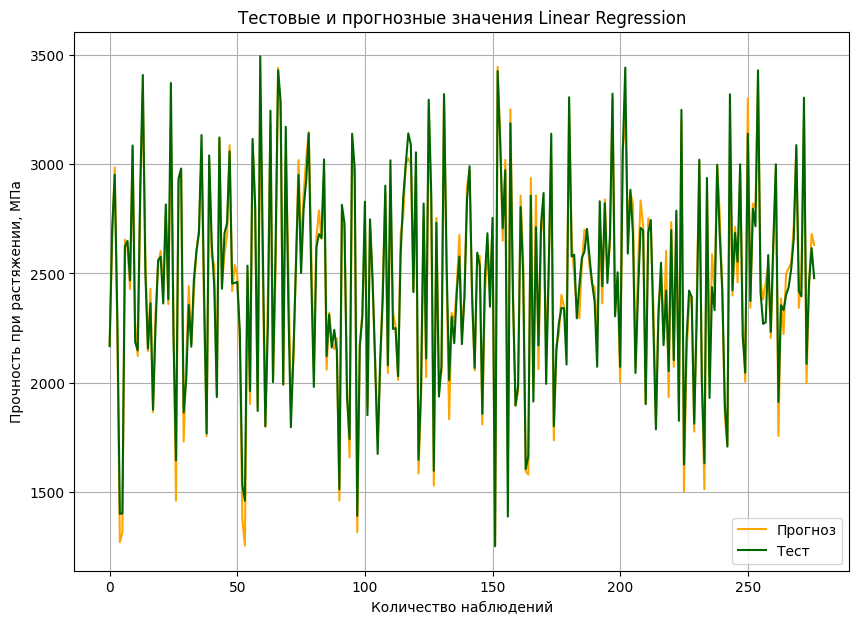

In [172]:
#Метод линейной регрессии. Построение модели и визуализация
lr = LinearRegression()
lr.fit(x_train_1, y_train_1)
y_pred_lr = lr.predict(x_test_1)
mae_lr = mean_absolute_error(y_pred_lr, y_test_1)
mse_lin_elast = mean_squared_error(y_test_1, y_pred_lr)
print('Linear Regression Results Train:') # Скор для тренировочной выборки
print("Test score: {:.2f}".format(lr.score(x_train_1, y_train_1)))
print('Linear Regression Results:')    
print('lr_MAE:', round(mean_absolute_error(y_test_1, y_pred_lr)))
print('lr_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_lr)))
print('lr_MSE: {:.2f}'.format(mse_lin_elast))
print("lr_RMSE: {:.2f}".format (np.sqrt(mse_lin_elast)))
print("Test score: {:.2f}".format(lr.score(x_test_1, y_test_1))) # Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Linear Regression")
plt.plot(y_pred_lr, label="Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)
#Линейная регрессия с задачей справилась в 97 % случаев.

Gradient Boosting Regressor Results Train:
Test score: 0.99
Gradient Boosting Regressor Results:
GBR_MAE: 65
GBR_MAPE: 0.03
GBR_MSE: 6570.29
GBR_RMSE: 81.06
Test score: 0.97


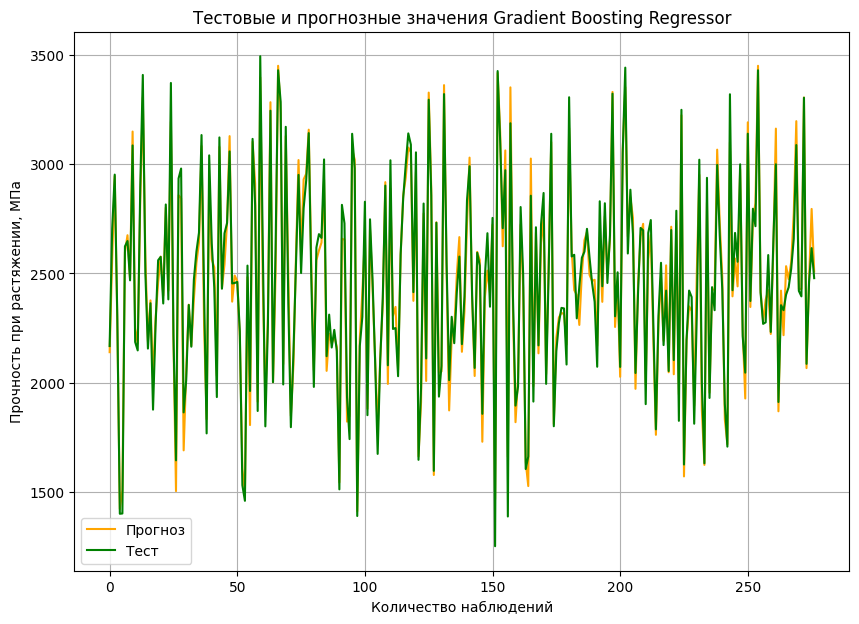

In [173]:
#Метода градиентного бустинга. Построение модели и визуализация
gbr = make_pipeline(StandardScaler(), GradientBoostingRegressor())
gbr.fit(x_train_1, np.ravel(y_train_1))
y_pred_gbr = gbr.predict(x_test_1)
mae_gbr = mean_absolute_error(y_pred_gbr, y_test_1)
mse_gbr_elast = mean_squared_error(y_test_1,y_pred_gbr)
print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(gbr.score(x_train_1, y_train_1))) # Скор для тренировочной выборки
print('Gradient Boosting Regressor Results:')
print('GBR_MAE:', round(mean_absolute_error(y_test_1, y_pred_gbr)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_gbr)))
print('GBR_MSE: {:.2f}'.format(mse_gbr_elast))
print("GBR_RMSE: {:.2f}".format (np.sqrt(mse_gbr_elast)))
print("Test score: {:.2f}".format(gbr.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Gradient Boosting Regressor")
plt.plot(y_pred_gbr, label = "Прогноз", color = "orange")
plt.plot(y_test_1.values, label = "Тест", color = "green")
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)
#Градиентный бустинг с задачей справился в 97 % случаев.

K Neighbors Regressor  Results Train:
Test score: 0.94
K Neighbors Regressor  Results:
KNN_MAE: 102
KNN_MAPE: 0.04
KNN_MSE: 16723.93
KNN_RMSE: 129.32
Test score: 0.92


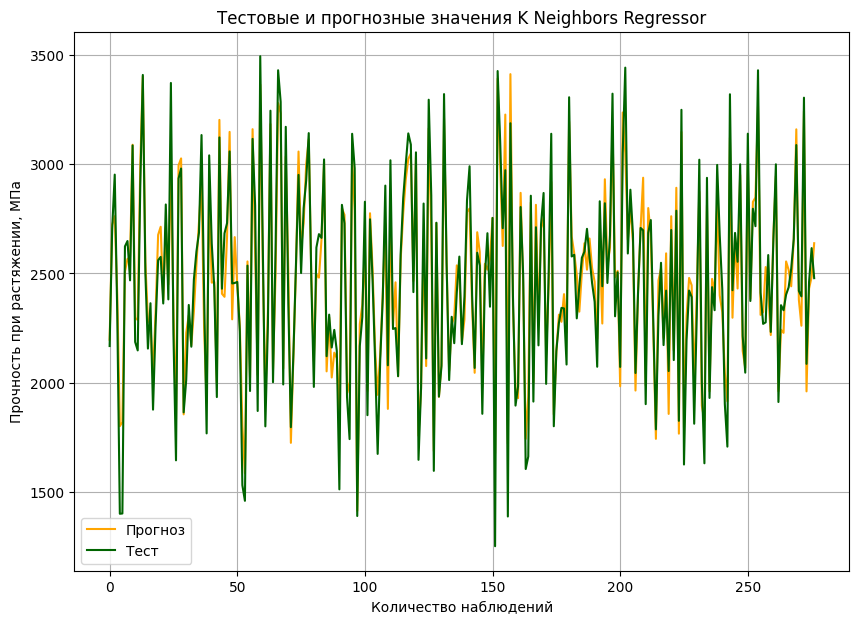

In [174]:
# Метод К ближайших соседей. Построение модели и визуализация
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(x_train_1, y_train_1)
y_pred_knn = knn.predict(x_test_1)
mae_knr = mean_absolute_error(y_pred_knn, y_test_1)
mse_knn_elast = mean_squared_error(y_test_1,y_pred_knn)
print('K Neighbors Regressor  Results Train:')
print("Test score: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('K Neighbors Regressor  Results:')
print('KNN_MAE:', round(mean_absolute_error(y_test_1, y_pred_knn)))
print('KNN_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_knn)))
print('KNN_MSE: {:.2f}'.format(mse_knn_elast))
print("KNN_RMSE: {:.2f}".format (np.sqrt(mse_knn_elast)))
print("Test score: {:.2f}".format(knn.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения K Neighbors Regressor")
plt.plot(y_pred_knn, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Decision Tree Regressor Results Train:
Test score: 0.94
Decision Tree Regressor Results:
DTR_MAE: 107
DTR_MSE: 18712.85
DTR_RMSE: 136.79
DTR_MAPE: 0.05
Test score: 0.91


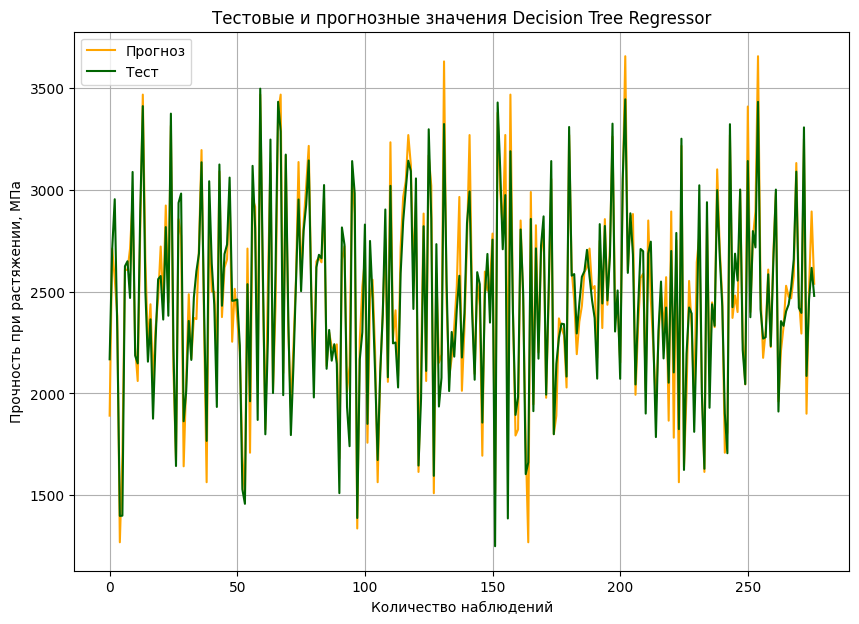

In [175]:
#Деревья решений. Построение модели и визуализация.
dtr = DecisionTreeRegressor()
dtr.fit(x_train_1, y_train_1.values)
y_pred_dtr = dtr.predict(x_test_1)
mae_dtr = mean_absolute_error(y_pred_dtr, y_test_1)
mse_dtr_elast = mean_squared_error(y_test_1,y_pred_dtr)
print('Decision Tree Regressor Results Train:')
print("Test score: {:.2f}".format(knn.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Decision Tree Regressor Results:')
print('DTR_MAE:', round(mean_absolute_error(y_test_1, y_pred_dtr)))
print('DTR_MSE: {:.2f}'.format(mse_dtr_elast))
print("DTR_RMSE: {:.2f}".format (np.sqrt(mse_dtr_elast)))
print('DTR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_dtr)))
print("Test score: {:.2f}".format(dtr.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Decision Tree Regressor")
plt.plot(y_pred_dtr, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Stochastic Gradient Descent Regressor Results Train:
Test score: 0.74
Stochastic Gradient Descent Regressor Results:
SGD_MAE: 182
SGD_MSE: 52303.15
SGD_RMSE: 228.70
SGD_MAPE: 0.08
Test score: 0.76


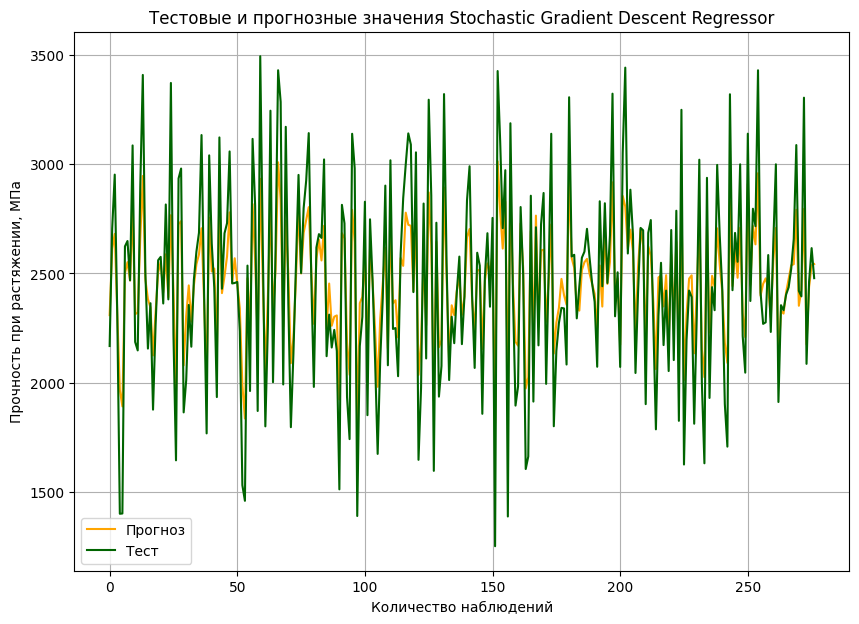

In [176]:
# Стохастический градиентный спуск. Построение модели и визуализация
sdg = SGDRegressor()
sdg.fit(x_train_1, y_train_1)
y_pred_sdg = sdg.predict(x_test_1)
mae_sdg = mean_absolute_error(y_pred_sdg, y_test_1)
mse_sdg_elast = mean_squared_error(y_test_1,y_pred_sdg)
print('Stochastic Gradient Descent Regressor Results Train:')
print("Test score: {:.2f}".format(sdg.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Stochastic Gradient Descent Regressor Results:')
print('SGD_MAE:', round(mean_absolute_error(y_test_1, y_pred_sdg)))
print('SGD_MSE: {:.2f}'.format(mse_sdg_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_sdg_elast)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_sdg)))
print("Test score: {:.2f}".format(sdg.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Stochastic Gradient Descent Regressor")
plt.plot(y_pred_sdg, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Multi-layer Perceptron regressor Results Train:
Test score: -16.28
Multi-layer Perceptron regressor Results:
SGD_MAE: 1809
SGD_MAPE: 0.72
SGD_MSE: 3519503.40
SGD_RMSE: 1876.03
Test score: -15.44


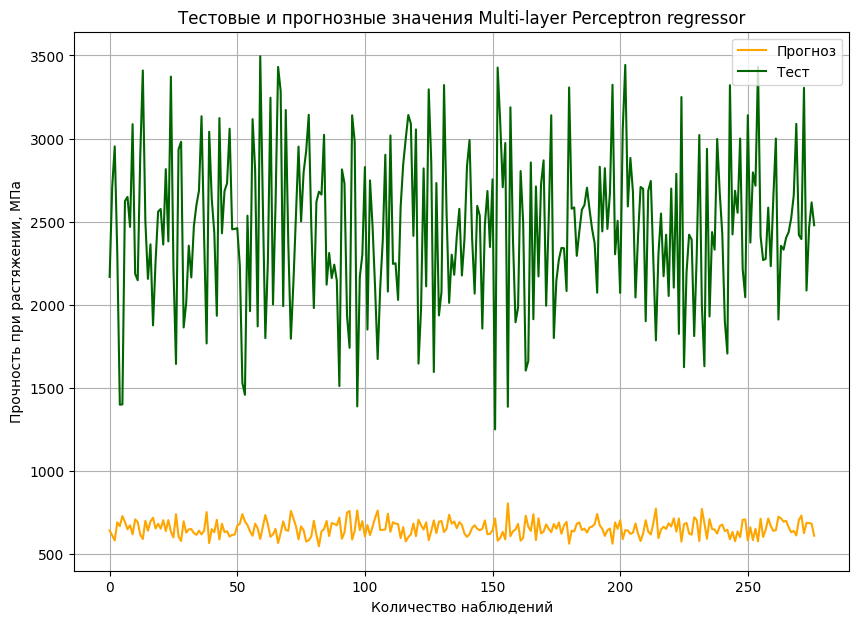

In [177]:
# Многослойный перцептрон. Построение модели и визуализация
mlp = MLPRegressor(random_state = 1, max_iter = 500).fit(x_train_1, y_train_1)
y_pred_mlp = mlp.predict(x_test_1)
mae_mlp = mean_absolute_error(y_pred_mlp, y_test_1)
mse_mlp_elast = mean_squared_error(y_test_1,y_pred_mlp)
print('Multi-layer Perceptron regressor Results Train:')
print("Test score: {:.2f}".format(mlp.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Multi-layer Perceptron regressor Results:')
print('SGD_MAE:', round(mean_absolute_error(y_test_1, y_pred_mlp)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_mlp)))
print('SGD_MSE: {:.2f}'.format(mse_mlp_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_mlp_elast)))
print("Test score: {:.2f}".format(mlp.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Multi-layer Perceptron regressor")
plt.plot(y_pred_mlp, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

Ради эксперимента опробовал разное количество max_iter в многослойном перцептроне до 5 тысяч. Результат показал относительное улучшение работы модели и сведение получаемой ошибки к -0,5. Но в связи с тем, что желаемого результата мы не получаем, принято решение снизить нагрузку на модель так как повышенная нагрузка не приносит реального положительного результата

Lasso regressor Results Train:
Test score: 0.95
Lasso regressor Results:
SGD_MAE: 69
SGD_MAPE: 0.03
SGD_MSE: 7750.08
SGD_RMSE: 88.03
Test score: 0.96


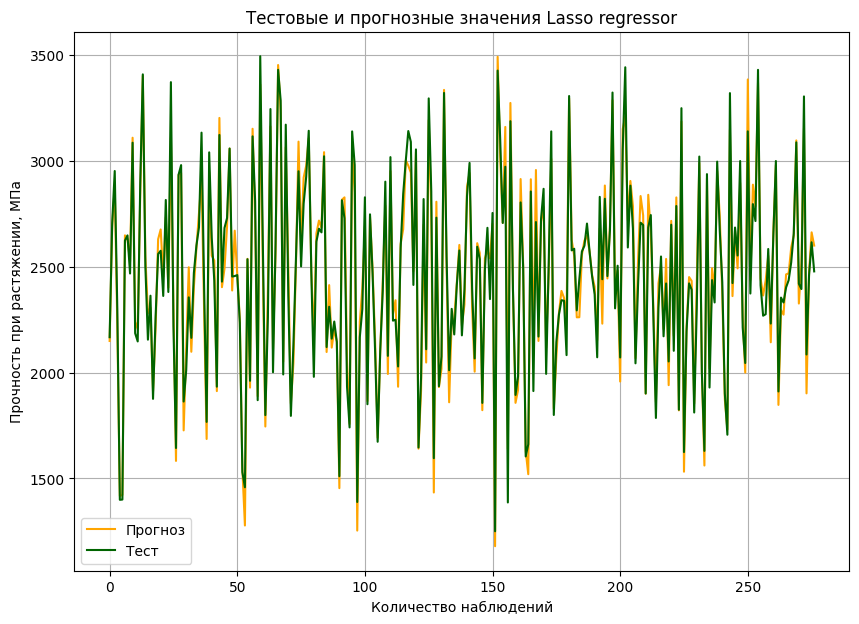

In [178]:
# Лассо регрессия. Построение модели и визуализация
clf = linear_model.Lasso(alpha=0.1)
clf.fit(x_train_1, y_train_1)
y_pred_clf = clf.predict(x_test_1)
mae_clf = mean_absolute_error(y_pred_clf, y_test_1)
mse_clf_elast = mean_squared_error(y_test_1,y_pred_clf)
print('Lasso regressor Results Train:')
print("Test score: {:.2f}".format(clf.score(x_train_1, y_train_1)))# Скор для тренировочной выборки
print('Lasso regressor Results:')
print('SGD_MAE:', round(mean_absolute_error(y_test_1, y_pred_clf)))
print('SGD_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test_1, y_pred_clf)))
print('SGD_MSE: {:.2f}'.format(mse_clf_elast))
print("SGD_RMSE: {:.2f}".format (np.sqrt(mse_clf_elast)))
print("Test score: {:.2f}".format(clf.score(x_test_1, y_test_1)))# Скор для тестовой выборки
plt.figure(figsize = (10, 7))
plt.title("Тестовые и прогнозные значения Lasso regressor")
plt.plot(y_pred_clf, label = "Прогноз", color = 'orange')
plt.plot(y_test_1.values, label = "Тест", color = 'darkgreen')
plt.xlabel("Количество наблюдений")
plt.ylabel("Прочность при растяжении, МПа")
plt.legend()
plt.grid(True)

In [179]:
#сравним наши модели по метрике МАЕ
mae_df = {'Регрессор': ['Support Vector', 'RandomForest', 'Linear Regression', 
'GradientBoosting', 'KNeighbors', 'DecisionTree', 'SGD', 'MLP', 'Lasso'], 
'MAE': [mae_svr, mae_rfr, mae_lr, mae_gbr, mae_knr, mae_dtr, mae_sdg, mae_mlp, 
                  mae_clf]} 
mae_df = pd.DataFrame(mae_df)

In [180]:
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.046842
4,KNeighbors,102.030259
5,DecisionTree,107.151106
6,SGD,181.662235
7,MLP,1808.547264
8,Lasso,69.474334


Оптимальными гиперпараметрами в машинном обучении называют параметры алгоритмов, значения которых устанавливаются перед запуском процесса обучения. Их назначение – быть вычисленными в процессе обучения. Гиперпараметры используются для управления процессом обучения. Один из способов настройки гиперпараметров состоит в том, чтобы заставить компьютер попробовать все возможные комбинации значений параметров. Для этого используем модуль GridSearchCV из библиотеки Scikit Learn. Попытаемся найти наилучшую комбинацию гиперпараметров для построения классификатора для нашего набора данных. 
Из плюсов можно отметить, что метод получит требуемые оптимальные гиперпараметры. В то же время есть минус - операция является исчерпывающей. Если диапазон или число гиперпараметров велики, то расчеты могут занять невероятное количество времени, а в случае наличия ошибок в коде могут являться досадной тратой ресурса и потерей времени. 

In [181]:
# Проведем поиск по сетке гиперпараметров с перекрестной проверкой, количество 
# блоков равно 10 (cv = 10), для модели случайного леса
parametrs = { 'n_estimators': [200, 300],
              'max_depth': [9, 15],
              'max_features': ['auto'],
              'criterion': ['friedman_mse'],}
grid = GridSearchCV(estimator = rfr, param_grid = parametrs, cv = 10)
grid.fit(x_train_1, y_train_1)

GridSearchCV(cv=10,
             estimator=RandomForestRegressor(max_depth=7, n_estimators=15,
                                             random_state=33),
             param_grid={'criterion': ['friedman_mse'], 'max_depth': [9, 15],
                         'max_features': ['auto'], 'n_estimators': [200, 300]})

In [182]:
grid.best_params_

{'criterion': 'friedman_mse',
 'max_depth': 15,
 'max_features': 'auto',
 'n_estimators': 300}

In [183]:
#Выводим гиперпараметры для оптимальной модели
print(grid.best_estimator_)
knr_upr = grid.best_estimator_
print(f'R2-score RFR для прочности при растяжении, МПа: {knr_upr.score(x_test_1, y_test_1).round(3)}')

RandomForestRegressor(criterion='friedman_mse', max_depth=15,
                      max_features='auto', n_estimators=300, random_state=33)
R2-score RFR для прочности при растяжении, МПа: 0.963


In [184]:
#подставим оптимальные гиперпараметры в нашу модель случайного леса
rfr_grid = RandomForestRegressor(n_estimators = 300, criterion = 'friedman_mse', 
                                 max_depth = 15, max_features = 'auto', random_state=33)
#Обучаем модель
rfr_grid.fit(x_train_1, y_train_1)

predictions_rfr_grid = rfr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_rfr_grid = mean_absolute_error(predictions_rfr_grid, y_test_1)
mae_rfr_grid

68.54476966086132

In [185]:
new_row_in_mae_df = {'Регрессор': 'RandomForest_GridSearchCV', 
                     'MAE': mae_rfr_grid} 
mae_df.loc[len(mae_df)] = 'RandomForest_GridSearchCV', mae_rfr_grid
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.046842
4,KNeighbors,102.030259
5,DecisionTree,107.151106
6,SGD,181.662235
7,MLP,1808.547264
8,Lasso,69.474334
9,RandomForest_GridSearchCV,68.544770


In [186]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество 
# блоков равно 10 (cv = 10), для Метода К ближайших соседей
knn = KNeighborsRegressor()
knn_params = {'n_neighbors' : range(1, 301, 2), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs = GridSearchCV(knn, knn_params, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs.fit(x_train_1, y_train_1)
knn_3 = gs.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1200 candidates, totalling 12000 fits


{'algorithm': 'auto', 'n_neighbors': 7, 'weights': 'distance'}

In [187]:
#Выводим гиперпараметры для оптимальной модели
print(gs.best_estimator_)
gs1 = gs.best_estimator_
print(f'R2-score KNR для прочности при растяжении, МПа: {gs1.score(x_test_1, y_test_1).round(3)}')

KNeighborsRegressor(n_neighbors=7, weights='distance')
R2-score KNR для прочности при растяжении, МПа: 0.923


In [188]:
#подставим оптимальные гиперпараметры в нашу модель метода к ближайших соседей
knn_grid = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 7, weights = 'distance')
#Обучаем модель
knn_grid.fit(x_train_1, y_train_1)

predictions_knn_grid = knn_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_knn_grid = mean_absolute_error(predictions_knn_grid, y_test_1)
mae_knn_grid

99.28169380035469

In [189]:
new_row_in_mae_df = {'Регрессор': 'KNeighbors_GridSearchCV', 'MAE': mae_knn_grid} 

mae_df.loc[len(mae_df)] = 'KNeighbors_GridSearchCV', mae_knn_grid
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.046842
4,KNeighbors,102.030259
5,DecisionTree,107.151106
6,SGD,181.662235
7,MLP,1808.547264
8,Lasso,69.474334
9,RandomForest_GridSearchCV,68.544770


In [190]:
# Проведем поиск  по сетке гиперпараметров с перекрестной проверкой, количество
# блоков равно 10 (cv = 10), для Деревья решений
criterion = ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
splitter = ['best', 'random']
max_depth = [3,5,7,9,11]
min_samples_leaf = [100,150,200]
min_samples_split = [200,250,300]
max_features = ['auto', 'sqrt', 'log2']
param_grid = {'criterion': criterion,
               'splitter': splitter,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'max_features': max_features}
#Запустим обучение модели. В качестве оценки модели будем использовать коэффициент детерминации (R^2)
# Если R2<0, это значит, что разработанная модель даёт прогноз даже хуже, чем простое усреднение.
gs4 = GridSearchCV(dtr, param_grid, cv = 10, verbose = 1, n_jobs =-1, scoring = 'r2')
gs4.fit(x_train_1, y_train_1)
dtr_3 = gs4.best_estimator_
gs.best_params_

Fitting 10 folds for each of 1080 candidates, totalling 10800 fits


{'algorithm': 'auto', 'n_neighbors': 7, 'weights': 'distance'}

In [191]:
#Выводим гиперпараметры для оптимальной модели
print(gs4.best_estimator_)
gs1 = gs4.best_estimator_
print(f'R2-score DTR для прочности при растяжении, МПа: {gs4.score(x_test_1, y_test_1).round(3)}')

DecisionTreeRegressor(criterion='friedman_mse', max_depth=5,
                      max_features='auto', min_samples_leaf=100,
                      min_samples_split=200)
R2-score DTR для прочности при растяжении, МПа: 0.826


In [192]:
#подставим оптимальные гиперпараметры в нашу модель метода деревья решений
dtr_grid = DecisionTreeRegressor(criterion = 'friedman_mse', max_depth = 5, max_features = 'auto',
                      min_samples_leaf = 100, min_samples_split = 200)
#Обучаем модель
dtr_grid.fit(x_train_1, y_train_1)

predictions_dtr_grid = dtr_grid.predict(x_test_1)
#Оцениваем точность на тестовом наборе
mae_dtr_grid = mean_absolute_error(predictions_dtr_grid, y_test_1)
mae_dtr_grid

152.89389897779333

In [193]:
new_row_in_mae_df = {'Регрессор': 'DecisionTree_GridSearchCV', 'MAE': mae_dtr_grid} 

mae_df.loc[len(mae_df)] = 'DecisionTree_GridSearchCV', mae_dtr_grid
mae_df

,Регрессор,MAE
0,Support Vector,78.477914
1,RandomForest,76.589025
2,Linear Regression,61.986894
3,GradientBoosting,65.046842
4,KNeighbors,102.030259
5,DecisionTree,107.151106
6,SGD,181.662235
7,MLP,1808.547264
8,Lasso,69.474334
9,RandomForest_GridSearchCV,68.544770


In [194]:
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators = 100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), 
                                                                None]},
{'regressor': [KNeighborsRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [DecisionTreeRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [SGDRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [MLPRegressor(random_state = 1, max_iter = 500)], 'preprocessing':  [StandardScaler(),
                                                                            MinMaxScaler(), None]},
{'regressor': [linear_model.Lasso(alpha = 0.1)], 'preprocessing':  [StandardScaler(), MinMaxScaler(), 
                                                                    None]},]
grid = GridSearchCV(pipe, param_grid, cv = 10)
grid.fit(x_train_1, np.ravel(y_train_1))
print("Наилучшие параметры:\n{}\n".format(grid.best_params_))
print("Наилучшее значение правильности перекрестной проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(x_test_1, y_test_1)))

Наилучшие параметры:
{'preprocessing': MinMaxScaler(), 'regressor': Lasso(alpha=0.1)}

Наилучшее значение правильности перекрестной проверки: 0.97
Правильность на тестовом наборе: 0.97


In [195]:
print("Наилучшая модель:\n{}".format(grid.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('regressor', Lasso(alpha=0.1))])


Нейронная сеть рекомендующая соотношение матрица-наполнитель.

In [196]:
# Сформируем входы и выход для модели

tv = df['Соотношение матрица-наполнитель'] #тренировочная выборка
tr_v = df.loc[:, df.columns != 'Соотношение матрица-наполнитель'] #тестовая выборка

# Разбиваем выборки на обучающую и тестовую
x_train, x_test, y_train, y_test = train_test_split(tr_v, tv, test_size = 0.3, random_state = 14)

In [197]:
# Нормализуем данные

x_train_n = tf.keras.layers.Normalization(axis=-1)
x_train_n.adapt(np.array(x_train.values))

In [204]:
def create_model(lyrs=[32], act='softmax', opt='SGD', dr=0.1):
    
    seed = 7
    np.random.seed(seed)
    tf.random.set_seed(seed)
    
    model = Sequential()
    model.add(Dense(lyrs[0], input_dim=x_train.shape[1], activation=act)) 
    for i in range(1,len(lyrs)):
        model.add(Dense(lyrs[i], activation=act))
    
    model.add(Dropout(dr))
    model.add(Dense(3, activation='tanh'))  # выходной слой
    
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['mae', 'accuracy'])
 
    return model

In [205]:
# строим модель
model = KerasClassifier(build_fn=create_model, verbose=0)

# определяем параметры
batch_size = [4, 10, 20, 50, 100]
epochs = [10, 50, 100, 200, 300]
param_grid = dict(batch_size=batch_size, epochs=epochs)

# поиск оптимальных параметров
grid = GridSearchCV(estimator=model, 
                    param_grid=param_grid,
                    cv=10,
                    verbose=1, n_jobs=-1)

grid_result = grid.fit(x_train, y_train)

Fitting 10 folds for each of 25 candidates, totalling 250 fits


In [206]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'batch_size': 4, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 100}
0.003101 (0.006202) with: {'batch_size': 4, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 4, 'epochs': 300}
0.003077 (0.009231) with: {'batch_size': 10, 'epochs': 10}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 100}
0.003101 (0.006202) with: {'batch_size': 10, 'epochs': 200}
0.001538 (0.004615) with: {'batch_size': 10, 'epochs': 300}
0.000000 (0.000000) with: {'batch_size': 20, 'epochs': 10}
0.000000 (0.000000) with: {'batch_size': 20, 'epochs': 50}
0.001538 (0.004615) with: {'batch_size': 20, 'epochs': 100}
0.003101 (0.006202) with: {'batch_size': 20, 'epochs': 200}
0.003101 (0.006202) with: {'batch_size': 20, 'epochs': 300}
0.003077 (0.009231) with: {'batch_size': 50, 'epochs': 10

In [207]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

optimizer = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Nadam']
param_grid = dict(opt=optimizer)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(np.array(x_train.values, dtype=float), np.array(y_train.values, dtype=float))

Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ............................................opt=SGD; total time=   3.6s
[CV] END ............................................opt=SGD; total time=   4.0s
[CV] END ............................................opt=SGD; total time=   3.6s
[CV] END ............................................opt=SGD; total time=   3.5s
[CV] END ............................................opt=SGD; total time=   3.9s
[CV] END ............................................opt=SGD; total time=   4.3s
[CV] END ............................................opt=SGD; total time=   3.9s
[CV] END ............................................opt=SGD; total time=   4.2s
[CV] END ............................................opt=SGD; total time=   4.2s
[CV] END ............................................opt=SGD; total time=   3.9s
[CV] END ........................................opt=RMSprop; total time=   4.0s
[CV] END .......................................

In [208]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003101 using {'opt': 'SGD'}
0.003101 (0.006202) with: {'opt': 'SGD'}
0.001538 (0.004615) with: {'opt': 'RMSprop'}
0.003101 (0.006202) with: {'opt': 'Adagrad'}
0.003101 (0.006202) with: {'opt': 'Adadelta'}
0.003101 (0.006202) with: {'opt': 'Adam'}
0.003077 (0.009231) with: {'opt': 'Nadam'}


In [209]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

layers = [[8],[16, 4],[32, 8, 3],[12, 6, 3], [64, 64, 3], [128, 64, 16, 3]]
param_grid = dict(lyrs=layers)

grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=10, verbose=2)
grid_result = grid.fit(np.array(x_train.values, dtype=float), np.array(y_train.values, dtype=float))

Fitting 10 folds for each of 6 candidates, totalling 60 fits
[CV] END ...........................................lyrs=[8]; total time=   3.4s
[CV] END ...........................................lyrs=[8]; total time=   3.4s
[CV] END ...........................................lyrs=[8]; total time=   3.5s
[CV] END ...........................................lyrs=[8]; total time=   3.4s
[CV] END ...........................................lyrs=[8]; total time=   3.5s
[CV] END ...........................................lyrs=[8]; total time=   4.0s
[CV] END ...........................................lyrs=[8]; total time=   3.7s
[CV] END ...........................................lyrs=[8]; total time=   3.8s
[CV] END ...........................................lyrs=[8]; total time=   4.2s
[CV] END ...........................................lyrs=[8]; total time=   3.6s
[CV] END .......................................lyrs=[16, 4]; total time=   3.6s
[CV] END .......................................

In [210]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.001538 using {'lyrs': [8]}
0.001538 (0.004615) with: {'lyrs': [8]}
0.001538 (0.004615) with: {'lyrs': [16, 4]}
0.001538 (0.004615) with: {'lyrs': [32, 8, 3]}
0.001538 (0.004615) with: {'lyrs': [12, 6, 3]}
0.001538 (0.004615) with: {'lyrs': [64, 64, 3]}
0.001538 (0.004615) with: {'lyrs': [128, 64, 16, 3]}


In [211]:
model = KerasClassifier(build_fn=create_model, epochs=50, batch_size=4, verbose=0)

activation = ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear']
param_grid = dict(act=activation)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=10)
grid_result = grid.fit(np.array(x_train.values, dtype=float), np.array(y_train.values, dtype=float))

In [212]:
# результаты
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.003077 using {'act': 'softmax'}
0.003077 (0.009231) with: {'act': 'softmax'}
0.003077 (0.009231) with: {'act': 'softplus'}
0.001538 (0.004615) with: {'act': 'softsign'}
0.001538 (0.004615) with: {'act': 'relu'}
0.001538 (0.004615) with: {'act': 'tanh'}
0.001538 (0.004615) with: {'act': 'sigmoid'}
0.001538 (0.004615) with: {'act': 'hard_sigmoid'}
0.003077 (0.009231) with: {'act': 'linear'}


In [298]:
# окончательная модель, зададим слои
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
model1 = tf.keras.Sequential([x_train_n, layers.Dense(128, activation='relu'),  
                                                 layers.Dense(128, activation='relu'), 
                                                 layers.Dense(128, activation='relu'), 
                                                 layers.Dense(64, activation='relu'),
                                                 layers.Dense(64, activation='relu'),
                                                 layers.Dense(32, activation='relu'), 
                                                 layers.Dense(16, activation='relu'), 
                                                 layers.Dense(1)
                            ])

model1.compile(optimizer = tf.keras.optimizers.Adam(0.001), loss = 'mean_squared_error', 
               metrics = [tf.keras.metrics.RootMeanSquaredError()])  
# Посмотрим на архитектуру модели

model1.summary()

Model: "sequential_435"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_1 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_1143 (Dense)          (None, 128)               1664      
                                                                 
 dense_1144 (Dense)          (None, 128)               16512     
                                                                 
 dense_1145 (Dense)          (None, 128)               16512     
                                                                 
 dense_1146 (Dense)          (None, 64)                8256      
                                                                 
 dense_1147 (Dense)          (None, 64)                4160      
                                                    

In [299]:
# Обучим модель

model_hist1 = model1.fit(
    np.array(x_train.values, dtype=float), 
    np.array(y_train.values, dtype=float), 
    epochs = 100, 
    batch_size = 4,
    verbose = 1, 
        validation_split = 0.3)

Epoch 1/100
113/113 [==============================] - 1s 2ms/step - loss: 1.9376 - root_mean_squared_error: 1.3920 - val_loss: 1.2474 - val_root_mean_squared_error: 1.1169
Epoch 2/100
113/113 [==============================] - 0s 1ms/step - loss: 0.9488 - root_mean_squared_error: 0.9740 - val_loss: 1.1526 - val_root_mean_squared_error: 1.0736
Epoch 3/100
113/113 [==============================] - 0s 1ms/step - loss: 0.8005 - root_mean_squared_error: 0.8947 - val_loss: 1.3291 - val_root_mean_squared_error: 1.1529
Epoch 4/100
113/113 [==============================] - 0s 1ms/step - loss: 0.7190 - root_mean_squared_error: 0.8480 - val_loss: 1.1254 - val_root_mean_squared_error: 1.0608
Epoch 5/100
113/113 [==============================] - 0s 1ms/step - loss: 0.6434 - root_mean_squared_error: 0.8021 - val_loss: 1.1777 - val_root_mean_squared_error: 1.0852
Epoch 6/100
113/113 [==============================] - 0s 1ms/step - loss: 0.6495 - root_mean_squared_error: 0.8059 - val_loss: 1.3882 

113/113 [==============================] - 0s 1ms/step - loss: 0.0526 - root_mean_squared_error: 0.2294 - val_loss: 1.2593 - val_root_mean_squared_error: 1.1222
Epoch 49/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0497 - root_mean_squared_error: 0.2230 - val_loss: 1.3422 - val_root_mean_squared_error: 1.1585
Epoch 50/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0395 - root_mean_squared_error: 0.1987 - val_loss: 1.3260 - val_root_mean_squared_error: 1.1515
Epoch 51/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0334 - root_mean_squared_error: 0.1826 - val_loss: 1.2386 - val_root_mean_squared_error: 1.1129
Epoch 52/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0442 - root_mean_squared_error: 0.2102 - val_loss: 1.2837 - val_root_mean_squared_error: 1.1330
Epoch 53/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0455 - root_mean_squared_error: 0.2133 - val_loss: 1.2433 - val_r

113/113 [==============================] - 0s 1ms/step - loss: 0.0461 - root_mean_squared_error: 0.2147 - val_loss: 1.2687 - val_root_mean_squared_error: 1.1264
Epoch 96/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0354 - root_mean_squared_error: 0.1882 - val_loss: 1.2181 - val_root_mean_squared_error: 1.1037
Epoch 97/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0194 - root_mean_squared_error: 0.1394 - val_loss: 1.2493 - val_root_mean_squared_error: 1.1177
Epoch 98/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0112 - root_mean_squared_error: 0.1057 - val_loss: 1.2075 - val_root_mean_squared_error: 1.0989
Epoch 99/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0065 - root_mean_squared_error: 0.0804 - val_loss: 1.2312 - val_root_mean_squared_error: 1.1096
Epoch 100/100
113/113 [==============================] - 0s 1ms/step - loss: 0.0045 - root_mean_squared_error: 0.0671 - val_loss: 1.1989 - val_

In [300]:
model1.evaluate(np.array(x_test.values, dtype=float), np.array(y_test.values, dtype=float))

9/9 [==============================] - 0s 875us/step - loss: 1.0502 - root_mean_squared_error: 1.0248


[1.0502184629440308, 1.0248016119003296]

In [301]:
y_pred_model = model1.predict(np.array(x_test.values, dtype=float))

print('Model Results:')
print('Model_MAE: ', round(mean_absolute_error(y_test, y_pred_model)))
print('Model_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_model)))
print("Test score: {:.2f}".format(mean_squared_error(y_test, y_pred_model)))

9/9 [==============================] - 0s 625us/step
Model Results:
Model_MAE:  1
Model_MAPE: 0.34
Test score: 1.05


In [302]:
# Посмотрим на потери модели

model_hist1.history

{'loss': [1.9376277923583984,
  0.9487708210945129,
  0.8005196452140808,
  0.7190291881561279,
  0.6433937549591064,
  0.6494722962379456,
  0.5003411173820496,
  0.46814242005348206,
  0.33645662665367126,
  0.32208454608917236,
  0.2388421595096588,
  0.20260348916053772,
  0.1702008694410324,
  0.13347618281841278,
  0.108568474650383,
  0.07310327887535095,
  0.06510336697101593,
  0.07209909707307816,
  0.07906311005353928,
  0.061345696449279785,
  0.05252775922417641,
  0.06558122485876083,
  0.07804776728153229,
  0.06782998889684677,
  0.06479135900735855,
  0.054648879915475845,
  0.040100183337926865,
  0.07720983773469925,
  0.06973346322774887,
  0.05175241082906723,
  0.05489187315106392,
  0.05958354100584984,
  0.09490066766738892,
  0.07510651648044586,
  0.04814039170742035,
  0.0514402836561203,
  0.048872511833906174,
  0.03250584751367569,
  0.02970011904835701,
  0.04319774731993675,
  0.051251377910375595,
  0.03449136018753052,
  0.035487279295921326,
  0.03758

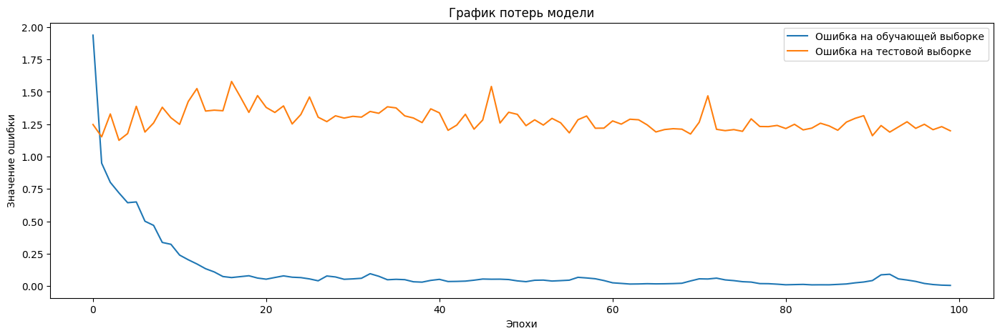

In [303]:
# Посмотрим на график потерь на тренировочной и тестовой выборках
def model_loss_plot(model_hist1):
    plt.figure(figsize = (17,5))
    plt.plot(model_hist1.history['loss'],
             label = 'ошибка на обучающей выборке')
    plt.plot(model_hist1.history['val_loss'],
            label = 'ошибка на тестовой выборке')
    plt.title('График потерь модели')
    plt.ylabel('Значение ошибки')
    plt.xlabel('Эпохи')
    plt.legend(['Oшибка на обучающей выборке', 'Ошибка на тестовой выборке'], loc='best')
    plt.show()
model_loss_plot(model_hist1)

9/9 [==============================] - 0s 750us/step


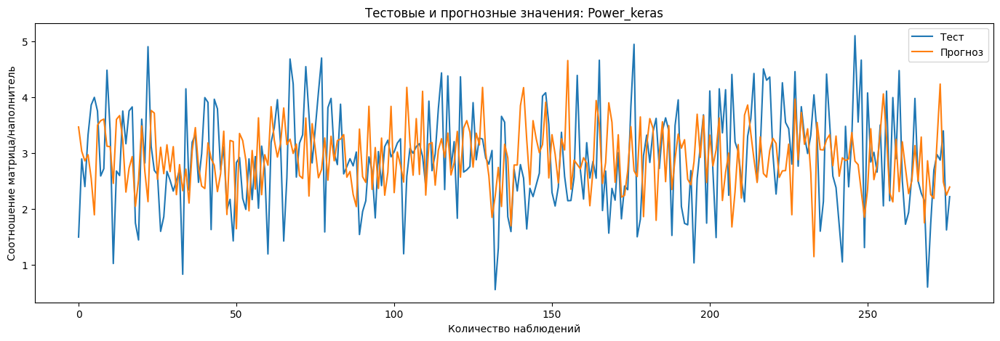

In [304]:
# Зададим функцию для визуализации факт/прогноз для результатов моделей
# Посмотрим на график результата работы модели
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label = 'Тест')
    plt.plot(predict, label = 'Прогноз')
    plt.legend(loc = 'best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()
actual_and_predicted_plot(y_test.values, model1.predict(x_test.values), 
                          'Cоотношение матрица/наполнитель', 'Power_keras')

In [305]:
# оценка модели MSE
model1.evaluate(x_test, y_test, verbose = 1)

9/9 [==============================] - 0s 875us/step - loss: 1.0502 - root_mean_squared_error: 1.0248


[1.0502184629440308, 1.0248016119003296]

9/9 [==============================] - 0s 750us/step


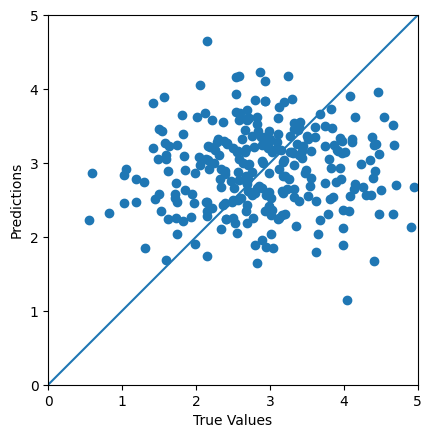

In [306]:
test_predictions = model1.predict(np.array(x_test.values, dtype=float)).flatten()
a = plt.axes(aspect = 'equal')
plt.scatter(np.array(y_test.values, dtype=float), np.array(test_predictions, dtype=float))
plt.xlabel('True Values')
plt.ylabel('Predictions')
lims = [0, 5]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

In [247]:
# Сохраняем модель для разработки веб-приложения для прогнозирования 
# соотношения "матрица-наполнитель" в фреймворке Flask
model1.save('/ideal_model/')

INFO:tensorflow:Assets written to: /ideal_model/assets


INFO:tensorflow:Assets written to: /ideal_model/assets


In [248]:
load_model = keras.models.load_model("/ideal_model")

In [249]:
load_model.predict(x_test)

9/9 [==============================] - 0s 750us/step


array([[3.1352386 ],
       [2.9990504 ],
       [3.4314957 ],
       [2.8789408 ],
       [1.8705127 ],
       [1.3781221 ],
       [3.2742732 ],
       [4.8165956 ],
       [2.921151  ],
       [3.7959754 ],
       [4.025002  ],
       [3.3207614 ],
       [3.655279  ],
       [4.6136036 ],
       [2.9173157 ],
       [2.3955107 ],
       [2.7523892 ],
       [2.3751674 ],
       [2.4181168 ],
       [3.262628  ],
       [3.1901808 ],
       [2.7877724 ],
       [1.9780757 ],
       [3.470548  ],
       [3.1107209 ],
       [3.197997  ],
       [3.1362617 ],
       [2.6945598 ],
       [3.0603788 ],
       [2.2192678 ],
       [3.2002203 ],
       [3.0605767 ],
       [2.8556373 ],
       [3.0813935 ],
       [2.6474636 ],
       [2.1094224 ],
       [2.820169  ],
       [3.4016643 ],
       [2.550718  ],
       [2.4473789 ],
       [2.685338  ],
       [2.7476726 ],
       [3.3784711 ],
       [2.7323635 ],
       [2.297536  ],
       [3.5864074 ],
       [2.5965424 ],
       [2.773

In [250]:
model1.predict(x_test)

9/9 [==============================] - 0s 625us/step


array([[3.1352386 ],
       [2.9990504 ],
       [3.4314957 ],
       [2.8789408 ],
       [1.8705127 ],
       [1.3781221 ],
       [3.2742732 ],
       [4.8165956 ],
       [2.921151  ],
       [3.7959754 ],
       [4.025002  ],
       [3.3207614 ],
       [3.655279  ],
       [4.6136036 ],
       [2.9173157 ],
       [2.3955107 ],
       [2.7523892 ],
       [2.3751674 ],
       [2.4181168 ],
       [3.262628  ],
       [3.1901808 ],
       [2.7877724 ],
       [1.9780757 ],
       [3.470548  ],
       [3.1107209 ],
       [3.197997  ],
       [3.1362617 ],
       [2.6945598 ],
       [3.0603788 ],
       [2.2192678 ],
       [3.2002203 ],
       [3.0605767 ],
       [2.8556373 ],
       [3.0813935 ],
       [2.6474636 ],
       [2.1094224 ],
       [2.820169  ],
       [3.4016643 ],
       [2.550718  ],
       [2.4473789 ],
       [2.685338  ],
       [2.7476726 ],
       [3.3784711 ],
       [2.7323635 ],
       [2.297536  ],
       [3.5864074 ],
       [2.5965424 ],
       [2.773

Заключение.
Процесс построения моделей прогнозирования является сложной задачей и требует наличия практических навыков программирования, немалого погружения в тему, в рамках которой формируется модель, понимание математических методов и их правильного подбора.
В ходе работы был использован датасет с данными, проведен его анализ. В рамках анализа были построены графики, гистограммы, тепловые карты корреляции и т.д. Выполнено разделение датасета на обучающую и тестовую выборки на базе библиотеки Scikit-learn, которая является мощным инструментом в процессе  машинного обучения.
    В рамках машинного обучения и поиска гиперпараметров были задействованы несколько алгоритмов: линейная регрессия, градиентный бустинг, К ближайших соседей,  деревья решений, стохастический градиентный спуск, многослойный перцептрон, лассо регрессия, а также опорные вектора и случайный лес. 
Поиск гиперпараметров осуществлялся при помощи таких методов, как «GridSearch». Для каждой из выборок были составлены классификационные отчёты, содержащие в себе основополагающие метрики, оценивающие качество проводимого обучения. 
В конечном итоге было представлено сравнение результатов оценок работы алгоритмов, а также различные графики и диаграммы, позволяющие наглядно оценить итоги проведенного обучения. 
    Выполнено обучение нейронной сети и разработано пользовательское приложение, предсказывающе вероятный прогноз по заданным параметрам. Непосредственная модель прогнозирования получилась не идеальной - нет предсказаний со 100%-ым результатом. Основные предложения для улучшения:
    - поиск новых фич и в результате получение новых метрик-параметров;
    - более глубокое погружение в теоретическую часть работы в композитных материалах.